 ## <center>Unsupervised Classification Project</center>

**<center>🤖 SALHI Youssef | LABRIJI Saad 🤖</center>**
 **<center>AMSD | MLSD</center>**

 <center><img src="https://d.newsweek.com/en/full/1640682/universite-de-paris-logo.jpg?w=560&f=492708c6f355b39f35675cded3f9f67b" alt="TuneIn Logo" width="300"></center>


## **📊 Project Objective 📈**

Our colossal mission: implement unsupervised classification to segment time series reflecting electrical consumption in 100 households. The automation of disturbance detection, indicative of collective changes in consumption habits over a 91-day period, with 30-minute intervals, forms the pulsating core of our approach. Precision and depth, embodied by our analysis, are the guiding stars of our exploration. Let's dive into this adventure with unwavering commitment. 🌐⚙️

**Table of Contents 📑**
1. Importation of necessary libraries/packages 📦
2. Descriptive analysis of the data 📊
3. Dimensionality reduction 📉
   - PCA - Principal Component Analysis 📈
   - Characteristics of time series 📊
   - Fourier Transform 🔄
4. Clustering 🧩
   - Hierarchical Clustering 🌳
   - K-means 🎯
   - Spectral Clustering 🌈
   - SOM - Self-Organizing Map 🗺️
5. Breakpoints - Segmentation 🚀

## 1. Importing Required Libraries & packages 📦


In [1]:
# Standard Libraries
import calendar
import time
import warnings
from io import StringIO

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
import random

warnings.filterwarnings('ignore')

# Time Series Analysis
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib.dates import DateFormatter

from tslearn.barycenters import dtw_barycenter_averaging

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Clustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.metrics import calinski_harabasz_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import kneighbors_graph

# Data Preprocessing
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom
from tslearn.clustering import TimeSeriesKMeans
from scipy.sparse import csgraph
from scipy.sparse.csgraph import laplacian
from scipy import linalg
import ruptures as rpt
from sklearn.metrics import davies_bouldin_score

#### Download and Read the data

In [2]:
def read_data_from_url(url):
    """
    Read data from a given URL and return a DataFrame.

    Parameters:
    - url (str): The URL of the data file.

    Returns:
    - pd.DataFrame: The DataFrame containing the data.
    """
    response = requests.get(url)
    return pd.read_csv(StringIO(response.text), header=None, delimiter="\s+")


def rename_columns(df, new_column_names):
    """
    Rename columns of a DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame to be modified.
    - new_column_names (dict): A dictionary mapping old column names to new column names.
    """
    df.rename(columns=new_column_names, inplace=True)


def melt_dataframe(df, name):
    """
    Reshape a DataFrame by melting it and return the melted DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame to be melted.
    - name (str): The name for the melted values.

    Returns:
    - pd.DataFrame: The melted DataFrame.
    """
    melted_df = pd.melt(df, var_name="COLUMN", value_name=name)
    melted_df.drop(columns=["COLUMN"], inplace=True)
    melted_df.reset_index(drop=True, inplace=True)
    return melted_df


def process_appart_data(url_x, url_appart):
    """
    Process apartment data from two URLs and return a formatted DataFrame.

    Parameters:
    - url_x (str): The URL of the first data file (df_x).
    - url_appart (str): The URL of the second data file (df_appart).

    Returns:
    - pd.DataFrame: The processed DataFrame containing apartment data.
    """
    df_x = read_data_from_url(url_x)
    df_appart = read_data_from_url(url_appart)

    column_rename_mapping = {0: "APPART"}
    rename_columns(df_appart, column_rename_mapping)

    merged_df = pd.concat([df_appart, df_x], axis=1)

    appartements_dataframes = {}

    for appart_id in range(1, 101):  # The is 100 appartements in total
        filtered_appartments = merged_df.query("APPART == @appart_id").transpose()[1:]

        column_mapping = {
            old_column: f"JOUR_{old_column}"
            for old_column in filtered_appartments.columns
        }
        filtered_appartments.rename(columns=column_mapping, inplace=True)

        appartements_dataframes[f"appt_{appart_id}"] = melt_dataframe(
            filtered_appartments, f"appartement_{appart_id}"
        )

    result_df = pd.concat(appartements_dataframes.values(), axis=1)

    time_column = pd.date_range(start="1/1/2023", periods=len(result_df), freq="30min")
    result_df = pd.concat(
        [pd.DataFrame(time_column, columns=["Time"]), result_df], axis=1
    )

    return result_df


# URLs for the data
url_x = "http://allousame.free.fr/mlds/donnees/X.txt"
url_appart = "http://allousame.free.fr/mlds/donnees/APPART.txt"

# Process data and get the result DataFrame
appartements = process_appart_data(url_x, url_appart)

## 2. Descriptive analysis of the data 📊


In [3]:
appartements.head(3)

,Time,appartement_1,appartement_2,appartement_3,appartement_4,appartement_5,appartement_6,appartement_7,appartement_8,appartement_9,...,appartement_91,appartement_92,appartement_93,appartement_94,appartement_95,appartement_96,appartement_97,appartement_98,appartement_99,appartement_100
0,2023-01-01 00:00:00,-1.786785,-1.696926,0.152293,-0.951338,-1.117863,-0.619164,-1.934051,-1.231540,-0.915803,...,-1.458296,-0.943808,-1.058543,0.094067,-0.551474,-1.476726,-0.147306,-1.459160,-1.636396,-0.587143
1,2023-01-01 00:30:00,-1.759306,-1.589682,-0.001868,-1.038791,-1.209420,-0.809750,-1.509850,-1.642594,-0.966073,...,-1.435501,-1.081751,-1.189145,-0.598292,-0.770247,-1.384780,-0.628073,-1.487654,-1.735798,-0.958683
2,2023-01-01 01:00:00,-1.731826,-1.482438,-0.156029,-1.126245,-1.300976,-1.000337,-1.085648,-2.053648,-1.016343,...,-1.412706,-1.219694,-1.319748,-1.290650,-0.989019,-1.292834,-1.108839,-1.516149,-1.835200,-1.330222


#### Energy Consumption of apartment 1 to 5 over the time

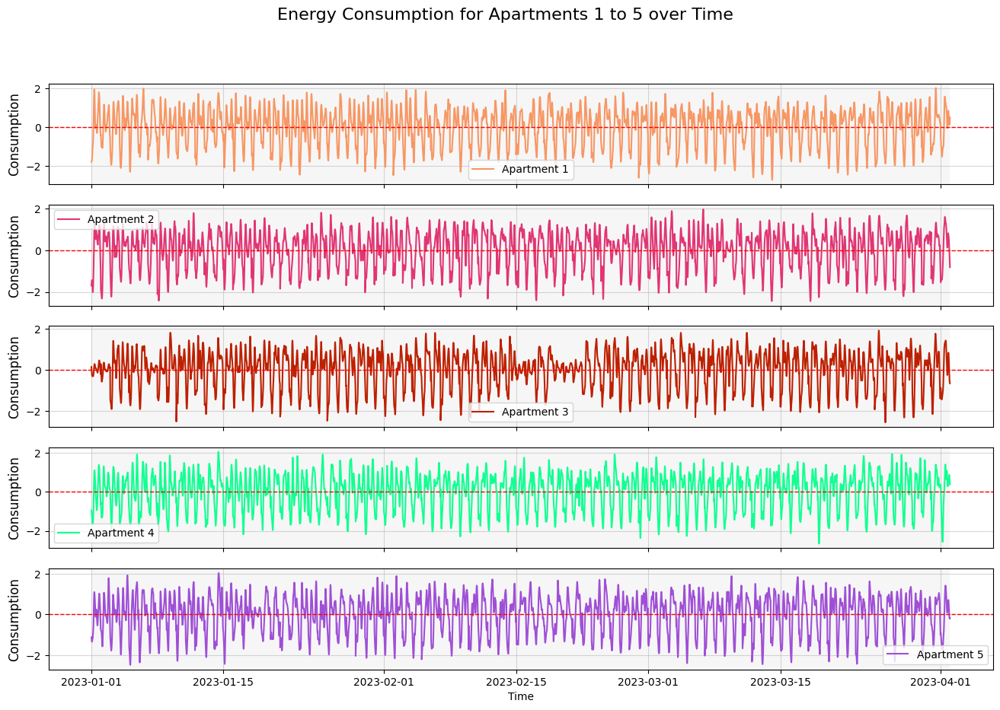

In [4]:
# Function to plot the evolution of energy consumption for multiple apartments
def plot_energy_evolution_subplots(data, apartments_list, title):
    num_apartments = len(apartments_list)
    fig, axes = plt.subplots(
        num_apartments, 1, figsize=(16, 2 * num_apartments), sharex=True
    )

    # Iterate through the list of apartments to plot each one
    for i, apartment in enumerate(apartments_list, start=1):
        color = "#{:06x}".format(
            random.randint(0, 0xFFFFFF)
        )  # Generate a random hex color
        sns.lineplot(
            data=data,
            x="Time",
            y=apartment,
            ax=axes[i - 1],
            label=f"Apartment {i}",
            color=color,
        )

        # Add labels for each subplot
        axes[i - 1].set_ylabel("Consumption", fontsize=12)
        axes[i - 1].grid(True, alpha=0.5)
        axes[i - 1].legend(fontsize=10)

    # Add a horizontal line at zero for reference to all subplots
    for ax in axes:
        ax.axhline(y=0, color="red", linestyle="--", linewidth=1)

    # Adding a light background color to all subplots
    for ax in axes:
        ax.axvspan(
            data["Time"].min(), data["Time"].max(), facecolor="lightgray", alpha=0.2
        )

    # Add title to the overall figure
    plt.suptitle(title, fontsize=16)

    # Show the plot
    plt.show()


# List of apartments to plot (e.g., apartments 1 to 5)
apartments_to_plot = [f"appartement_{i}" for i in range(1, 6)]

# Plot the evolution of energy consumption for the selected apartments using subplots
plot_energy_evolution_subplots(
    appartements,
    apartments_to_plot,
    "Energy Consumption for Apartments 1 to 5 over Time",
)

#### Display basic information about the DataFrame

In [5]:
print("Basic Info:")
print(appartements.info())

Basic Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Columns: 101 entries, Time to appartement_100
dtypes: datetime64[ns](1), float64(100)
memory usage: 3.4 MB
None


#### Display summary statistics of numerical columns

In [6]:
print("\nSummary Statistics:")
appartements.describe()


Summary Statistics:


,Time,appartement_1,appartement_2,appartement_3,appartement_4,appartement_5,appartement_6,appartement_7,appartement_8,appartement_9,...,appartement_91,appartement_92,appartement_93,appartement_94,appartement_95,appartement_96,appartement_97,appartement_98,appartement_99,appartement_100
count,4368,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,...,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000,4368.000000
mean,2023-02-15 11:45:00,-0.002530,0.004413,0.015500,0.006204,-0.015020,0.011876,-0.009568,-0.004192,-0.007229,...,-0.008100,0.003918,-0.001262,-0.016182,0.010086,0.012919,-0.003102,-0.006116,0.005128,0.005883
min,2023-01-01 00:00:00,-2.712846,-2.447783,-2.551442,-2.653337,-2.467466,-2.562437,-2.700008,-2.702164,-2.590997,...,-2.611149,-2.539062,-2.503646,-2.413261,-2.585659,-2.379652,-2.649557,-2.731046,-2.532689,-2.876890
25%,2023-01-23 17:52:30,-0.725368,-0.685750,-0.560713,-0.786456,-0.736808,-0.573818,-0.664835,-0.711016,-0.659036,...,-0.682643,-0.699428,-0.740452,-0.619514,-0.616893,-0.630666,-0.577420,-0.746196,-0.608027,-0.664546
50%,2023-02-15 11:45:00,0.187326,0.199865,0.196839,0.237604,0.173500,0.204500,0.166665,0.217121,0.185483,...,0.194054,0.217200,0.216330,0.154986,0.210437,0.163590,0.159631,0.201042,0.165678,0.220978
75%,2023-03-10 05:37:30,0.712630,0.693304,0.699138,0.722567,0.705925,0.674741,0.675292,0.724757,0.693059,...,0.729312,0.721589,0.710686,0.683651,0.721072,0.677992,0.680452,0.712878,0.684725,0.705751
max,2023-04-01 23:30:00,2.007661,1.964942,1.927615,2.054251,2.030829,2.021338,2.212948,2.033674,2.112233,...,1.947639,2.257098,2.102805,2.144196,1.972488,2.264872,2.107669,2.094527,1.971988,1.961424
std,NaN,0.971383,0.912896,0.923606,0.952719,0.940201,0.909548,0.919737,0.961334,0.945976,...,0.963038,0.961059,0.957068,0.935090,0.938572,0.921147,0.913192,0.964795,0.924264,0.940299


#### Check for missing values

In [7]:
print("\nMissing Values:")
appartements.isnull().sum()


Missing Values:


Time               0
appartement_1      0
appartement_2      0
appartement_3      0
appartement_4      0
                  ..
appartement_96     0
appartement_97     0
appartement_98     0
appartement_99     0
appartement_100    0
Length: 101, dtype: int64

#### Autocorrelation and Partial Autocorrelation Plots for a Apartment 1

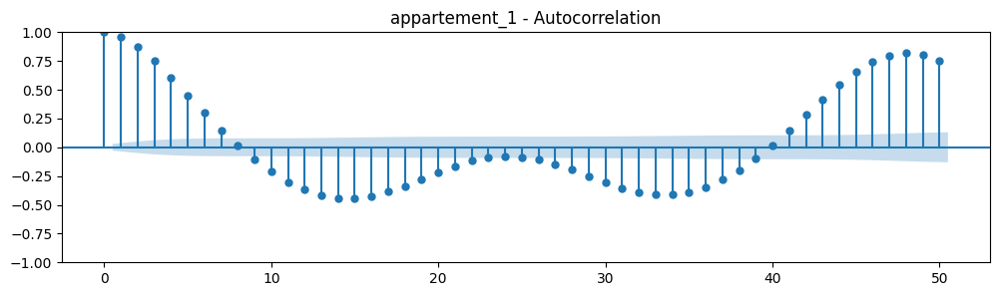

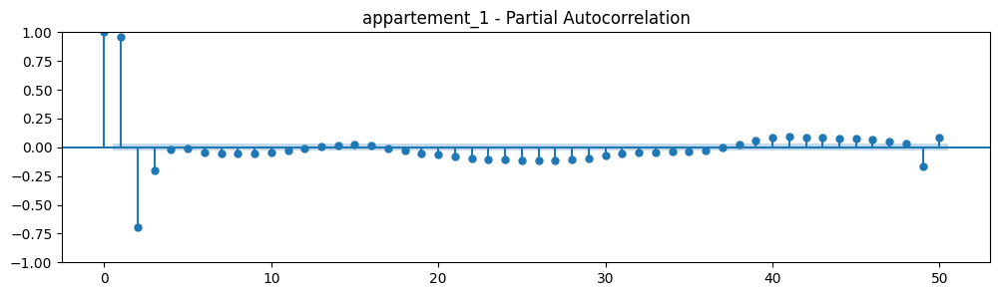

In [8]:
# Function to plot autocorrelation and partial autocorrelation
def plot_acf_pacf(data, lags=None, title=None):
    fig, ax = plt.subplots(figsize=(12, 3))

    # Autocorrelation plot
    sm.graphics.tsa.plot_acf(data, lags=lags, ax=ax, title=title + " - Autocorrelation")
    plt.show()

    fig, ax = plt.subplots(figsize=(12, 3))

    # Partial autocorrelation plot
    sm.graphics.tsa.plot_pacf(
        data, lags=lags, ax=ax, title=title + " - Partial Autocorrelation"
    )
    plt.show()

# Autocorrelation and partial autocorrelation plot for a specific apartment
selected_apartment = "appartement_1"
plot_acf_pacf(appartements[selected_apartment], lags=50, title=f"{selected_apartment}")

#### Time Series Analysis for Energy Consumption

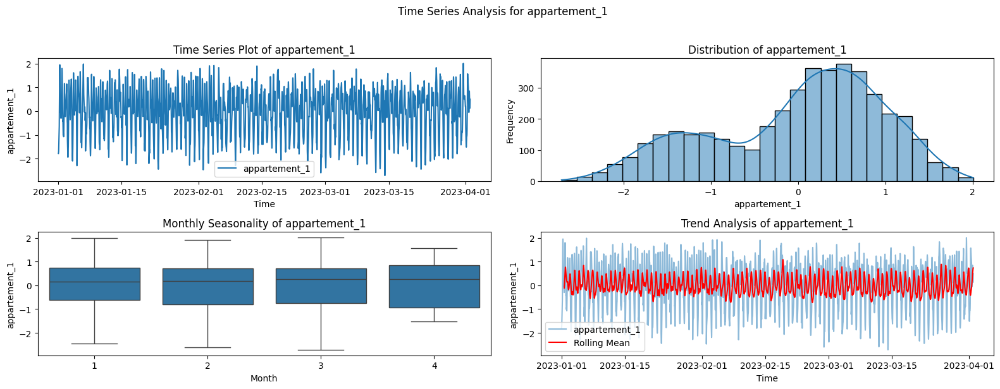

In [9]:
# Function to plot various time series visualizations
def plot_time_series_analysis(data, column, title=None):
    plt.figure(figsize=(16, 6))

    # Plot the time series data
    plt.subplot(2, 2, 1)
    sns.lineplot(data=data, x='Time', y=column, label=column)
    plt.title(f'Time Series Plot of {column}')
    plt.xlabel('Time')
    plt.ylabel(column)
    plt.legend()

    # Plot the distribution of the time series values
    plt.subplot(2, 2, 2)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    # Plot the seasonality using a boxplot
    plt.subplot(2, 2, 3)
    sns.boxplot(x=data['Time'].dt.month, y=data[column])  # Corrected the y parameter
    plt.title(f'Monthly Seasonality of {column}')
    plt.xlabel('Month')
    plt.ylabel(column)

    # Plot the rolling mean for trend analysis
    plt.subplot(2, 2, 4)
    rolling_mean = data[column].rolling(window=30).mean()  # Adjust the window as needed
    sns.lineplot(data=data, x='Time', y=column, label=column, alpha=0.5)
    sns.lineplot(data=data, x='Time', y=rolling_mean, label='Rolling Mean', color='red')
    plt.title(f'Trend Analysis of {column}')
    plt.xlabel('Time')
    plt.ylabel(column)
    plt.legend()

    plt.suptitle(title, y=1.02)
    plt.tight_layout()
    plt.show()

# Selected apartment for analysis
selected_apartment = "appartement_1"

# Perform time series analysis for the selected apartment
plot_time_series_analysis(appartements, column=selected_apartment, title=f'Time Series Analysis for {selected_apartment}')

#### Correlation Matrix

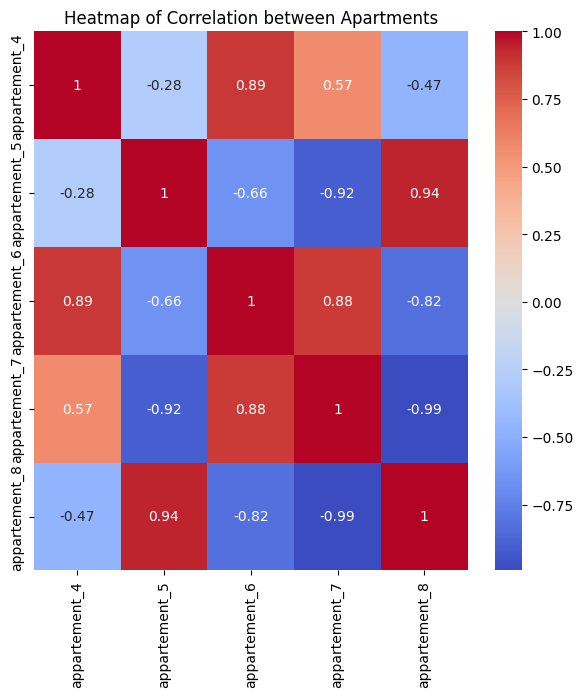

In [10]:
plt.figure(figsize=(7, 7))
sns.heatmap(appartements.iloc[4:9, 4:9].corr(), cmap='coolwarm', annot=True)
plt.title('Heatmap of Correlation between Apartments')
plt.show()

#### Autocorrelation and Partial Autocorrelation

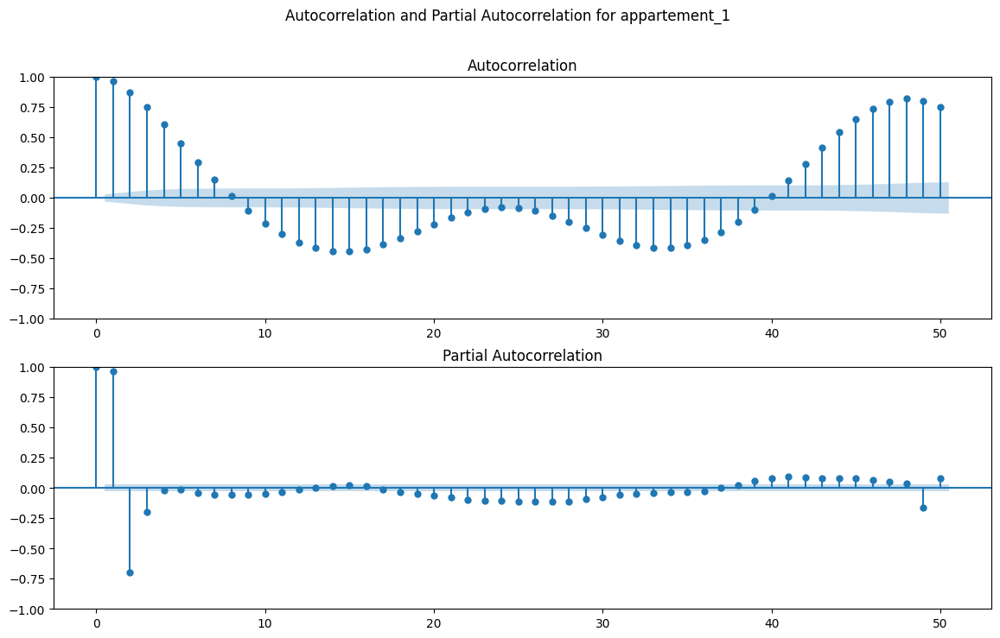

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(14, 8))
plot_acf(appartements[selected_apartment], lags=50, ax=axes[0])
plot_pacf(appartements[selected_apartment], lags=50, ax=axes[1])
plt.suptitle(f'Autocorrelation and Partial Autocorrelation for {selected_apartment}')
plt.show()

#### Seasonal Decomposition

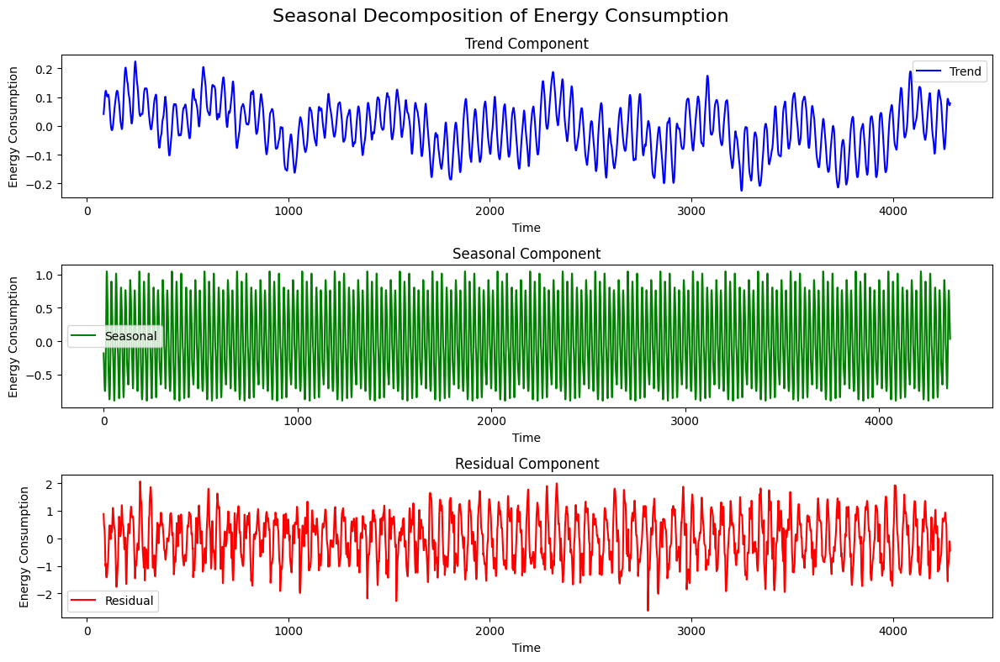

In [12]:
# Adjust the figure size for better visibility
plt.figure(figsize=(12, 8))

# Perform seasonal decomposition
result = seasonal_decompose(appartements[selected_apartment], model='additive', period=24*7)

# Plot the trend component
plt.subplot(3, 1, 1)
plt.plot(result.trend, label='Trend', color='blue')
plt.title('Trend Component')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.legend()

# Plot the seasonal component
plt.subplot(3, 1, 2)
plt.plot(result.seasonal, label='Seasonal', color='green')
plt.title('Seasonal Component')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.legend()

# Plot the residual component
plt.subplot(3, 1, 3)
plt.plot(result.resid, label='Residual', color='red')
plt.title('Residual Component')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.legend()

# Add a suptitle for the overall decomposition
plt.suptitle('Seasonal Decomposition of Energy Consumption', fontsize=16)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [13]:
df = appartements

In [14]:
# Aggregation journalière des données pour appartements
df_day = df.copy()  
df_day["Day"] = df_day['Time'].dt.strftime('%Y-%m-%d')  
df_day = df_day.drop(columns=['Time']).groupby(["Day"]).sum().reset_index()  


#### **Normalisation**

As mentioned earlier, we are likely more interested in explaining subtle differences in consumer behavior than the "raw" differences in consumption. We are much more intrigued by the shape of their time series than the average of their values, and therefore, normalization across different profiles seemed like a good idea to us.


In [15]:
# Aggregation journalière des données pour appartements
df_day = df.copy()  
df_day["Day"] = df_day['Time'].dt.strftime('%Y-%m-%d')  
df_day = df_day.drop(columns=['Time']).groupby(["Day"]).sum().reset_index()  

df_to_scale = df_day.set_index("Day")
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_to_scale)
df_scaled = pd.DataFrame(df_scaled)
df_scaled.describe()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,...,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01,9.100000e+01
mean,-3.172066e-17,-3.660076e-17,-9.150190e-18,-3.919331e-17,4.880101e-17,2.928061e-17,-2.440051e-18,-7.320152e-18,1.220025e-17,-2.684056e-17,...,-2.440051e-18,-1.570783e-17,3.172066e-17,-1.708035e-17,2.684056e-17,4.880101e-18,9.760202e-18,-2.135044e-17,-1.464030e-17,5.795120e-18
std,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,...,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00,1.005540e+00
min,-2.888745e+00,-3.265730e+00,-2.607497e+00,-1.853625e+00,-2.189280e+00,-2.443458e+00,-2.287049e+00,-2.198790e+00,-2.521146e+00,-2.421726e+00,...,-2.641514e+00,-2.401111e+00,-2.382653e+00,-3.703438e+00,-2.217479e+00,-2.039797e+00,-2.460237e+00,-2.885141e+00,-2.512289e+00,-3.518568e+00
25%,-5.981033e-01,-6.412752e-01,-5.767620e-01,-7.589852e-01,-6.650516e-01,-6.511284e-01,-6.059852e-01,-6.645619e-01,-8.057903e-01,-7.745588e-01,...,-6.473873e-01,-6.145505e-01,-5.518629e-01,-3.558065e-01,-6.745028e-01,-6.866298e-01,-6.273504e-01,-6.749090e-01,-6.095979e-01,-6.063911e-01
50%,2.090787e-01,1.176206e-01,1.928203e-02,3.529423e-02,-7.336114e-02,-6.923967e-02,-5.597430e-02,-1.093622e-01,9.744472e-02,-4.773094e-02,...,-5.422370e-02,5.370443e-02,-8.019602e-02,9.560399e-02,5.130790e-02,-1.032230e-01,7.876729e-02,-3.223327e-02,-1.186707e-01,-8.661057e-03
75%,6.390468e-01,6.336136e-01,8.027956e-01,7.084633e-01,7.675513e-01,5.080176e-01,6.081552e-01,6.168350e-01,6.109655e-01,6.087123e-01,...,6.018754e-01,5.802279e-01,4.902962e-01,5.929271e-01,6.357927e-01,5.972510e-01,6.828362e-01,7.260026e-01,7.529322e-01,7.256501e-01
max,2.756936e+00,2.777406e+00,1.986096e+00,2.398131e+00,2.694077e+00,2.687092e+00,2.132675e+00,2.512373e+00,2.696748e+00,2.664083e+00,...,2.522901e+00,2.400581e+00,3.948978e+00,2.189686e+00,2.775379e+00,2.908314e+00,2.385864e+00,2.134562e+00,2.448382e+00,2.450435e+00


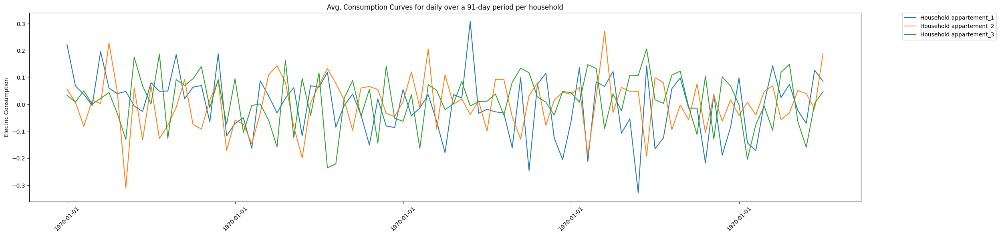

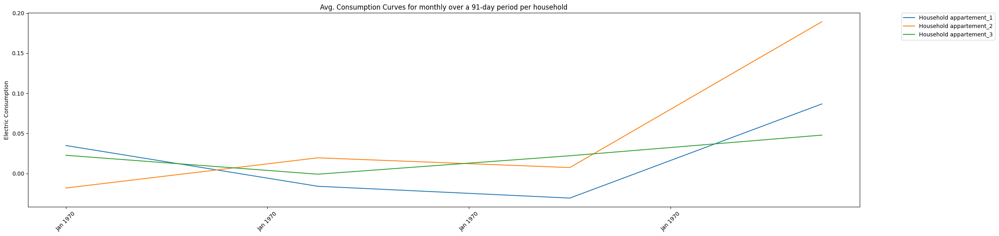

In [16]:
def plot_consumption_curves(data_frame, time_period, profiles):
    """
    Plot average electricity consumption curves for given time period and profiles.

    Parameters:
    - data_frame: DataFrame containing the electricity consumption data.
    - time_period: Time period for grouping data, "Month" or "Week".
    - profiles: List of profiles for which consumption curves are plotted.
    """

    # Make a copy of the DataFrame to avoid modification of the original
    df_copy = data_frame.copy()

    # Define parameters based on the time period
    date_length = 7 if time_period == "Month" else 10
    mode = "monthly" if time_period == "Month" else "daily"

    # Extract and group data based on the specified time period
    df_copy[time_period] = df_copy["Time"].astype("str").str[5:date_length]
    df_copy = df_copy.groupby(time_period).mean()

    # Create a figure for the plot
    fig, ax = plt.subplots(figsize=[25, 6])
    ax.set_ylabel("Electric Consumption")
    ax.set_title(f"Avg. Consumption Curves for {mode} over a 91-day period per household")

    # Use the "tab10" colormap for distinct and easily distinguishable colors
    colors = plt.cm.tab10.colors[:len(profiles)]

    for profile, color in zip(profiles, colors):
        ax.plot(df_copy.index, df_copy[profile], label=f"Household {profile}", color=color)

    # Configure x-axis ticks and labels for better readability
    date_format = '%b %Y' if time_period == 'Month' else '%Y-%m-%d'
    ax.xaxis.set_major_locator(plt.MaxNLocator(5))
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: pd.to_datetime(x).strftime(date_format)))

    # Display legend, adjust layout, and show the plot
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Example usage
plot_consumption_curves(data_frame=df, time_period="Day", profiles=["appartement_1", "appartement_2", "appartement_3"])
plot_consumption_curves(data_frame=df, time_period="Month", profiles=["appartement_1", "appartement_2", "appartement_3"])

# **3. Réduction de la dimension 📉**

This section is dedicated to techniques for dimensionality reduction and feature extraction.

Firstly, in order to establish consumption profiles, it is essential to reduce the number of features and aggregate our data for a clearer perspective. Aggregating consumption on a monthly or daily basis was a way to coarsely and arbitrarily reduce dimensionality, but it indicates that, to solve the clustering problem and prevent algorithms from being too time-consuming, representing consumption time series with fewer, but highly informative indicators is crucial. It is necessary to extract from this series what characterizes it the most to achieve truly effective clustering.

We have identified three possible ways to reduce the dimensionality of our data and extract features:

1. First, apply **PCA** to the data to mathematically optimize the loss of variance, although without obtaining interpretable features.
2. Recreate our own features, drawing inspiration from time series analysis techniques. This approach allows for easily interpretable features but may not be optimized specifically for clustering.
3. **Fourier Transform**

### **3.1 PCA - Principal Component Analysis 📈**
The objective of Principal Component Analysis (PCA) is to represent a point cloud by its projection onto the affine subspace of dimension k that minimizes inertia. Here, we have nearly 4368 different data points for each household, and we aim to reduce them to a sufficient number of features to explain 90% of the data variability.

For PCA to work, we need to normalize the data again, but this time **feature-wise**. Without this normalization, PCA would only select features with the most variance, as retaining these features preserves the maximum variance. In our case, this would mean looking only at moments with the most raw consumption differences, which is not our goal. We want to identify and target behavioral differences at any given time.

This ensures that certain dates do not carry more significance than others, allowing PCA to genuinely achieve dimensionality reduction.

In [17]:
# Initialize a StandardScaler object
scaler_acp = StandardScaler()

# Transpose the original DataFrame to have features as rows and samples as columns
# This is a common preprocessing step for some machine learning techniques
df_transposed = df_scaled.transpose()

# Use the StandardScaler to scale the transposed DataFrame
# Scaling is important for many machine learning algorithms to ensure features are on a similar scale
df_scaled_to_acp = scaler_acp.fit_transform(df_transposed)

# Convert the scaled array back to a DataFrame
df_scaled_to_acp = pd.DataFrame(df_scaled_to_acp)

# Display descriptive statistics of the scaled DataFrame
# This helps in understanding the distribution and characteristics of the scaled data
df_scaled_to_acp.describe()

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
count,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,...,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02
mean,-3.358425e-17,-1.956768e-17,4.107825e-17,-2.886580e-17,-7.660539e-17,-4.024558e-18,-1.165734e-16,-1.887379e-17,3.247402e-17,4.996004e-18,...,2.465042e-17,5.107026e-17,2.498002e-18,-4.218847e-17,3.677614e-17,-4.440892e-17,1.998401e-17,7.938095e-17,-6.883383e-17,-7.105427e-17
std,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,...,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00,1.005038e+00
min,-2.340248e+00,-2.650680e+00,-2.735055e+00,-2.149471e+00,-2.803177e+00,-2.471829e+00,-2.817411e+00,-3.075279e+00,-2.993520e+00,-2.899892e+00,...,-2.365727e+00,-2.346267e+00,-2.639807e+00,-2.467038e+00,-2.821334e+00,-1.893604e+00,-2.197805e+00,-1.977091e+00,-3.080774e+00,-2.717028e+00
25%,-6.929974e-01,-5.457336e-01,-6.796781e-01,-5.221553e-01,-6.050446e-01,-7.314096e-01,-6.852457e-01,-5.763264e-01,-6.839264e-01,-6.799468e-01,...,-5.867771e-01,-6.667655e-01,-6.817302e-01,-6.848685e-01,-7.985926e-01,-7.958040e-01,-5.805334e-01,-7.110709e-01,-6.617010e-01,-6.722441e-01
50%,-4.145874e-02,1.923822e-02,-3.067843e-02,-4.342826e-02,1.309274e-01,1.258871e-01,9.701606e-03,4.364113e-02,2.513445e-02,1.442338e-01,...,-5.770850e-02,5.651883e-02,3.630989e-03,-8.522491e-02,1.155653e-03,-1.514149e-01,-9.463222e-02,-3.051468e-02,3.308866e-03,1.322785e-01
75%,6.618519e-01,5.778678e-01,6.306636e-01,5.533096e-01,7.250219e-01,5.835691e-01,6.520393e-01,5.939330e-01,5.659823e-01,6.371207e-01,...,7.326426e-01,5.811675e-01,6.434752e-01,5.126661e-01,6.685408e-01,6.449807e-01,4.951141e-01,8.215754e-01,7.142641e-01,6.456870e-01
max,2.296146e+00,2.509379e+00,2.611311e+00,3.900113e+00,2.009252e+00,2.546364e+00,2.577429e+00,2.202448e+00,2.238482e+00,2.062382e+00,...,2.094321e+00,2.516738e+00,2.526539e+00,2.331427e+00,2.613661e+00,2.503186e+00,3.295281e+00,2.389558e+00,2.306777e+00,2.685144e+00



Our data is well normalized over time, so we can proceed to apply our Principal Component Analysis (PCA).

In [18]:
# Initialize a PCA (Principal Component Analysis) object
# We set n_components to 0.95 to retain 95% of the variance in the data
acp = PCA(n_components=0.95)

# Fit the PCA model to the scaled DataFrame and transform the data
# This reduces the dimensionality while retaining most of the important information
df_acp = pd.DataFrame(acp.fit_transform(df_scaled_to_acp))

# Display the DataFrame after applying PCA
# This DataFrame now contains the principal components that capture most of the variance
df_acp

,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
0,-3.135196,-0.164678,-0.364578,0.637250,-1.517390,2.734195,0.091045,2.571666,3.445291,-0.021527,...,-0.912928,0.148927,-0.755206,-0.119357,0.535406,1.092307,0.089899,-1.074330,0.215514,0.416995
1,0.361574,-1.540512,-0.805996,1.019425,1.393532,1.210297,-1.267075,-2.057341,2.070642,-0.641823,...,-1.561061,-1.164648,-0.803681,-1.594502,0.188696,0.461578,-1.731338,0.184483,0.153189,-0.333632
2,1.352010,-2.113286,5.751091,0.326116,-0.630978,-0.315415,0.117600,1.873658,0.147565,1.508805,...,0.633654,-0.071685,0.230498,-0.477237,-0.387314,0.299658,-0.106939,-1.130953,-0.571819,0.430543
3,0.509122,-0.888116,-0.716910,-1.947217,2.980348,2.435678,0.473574,0.676666,0.498984,1.324784,...,-0.321958,0.267999,-0.174502,-0.681937,0.452348,-0.302225,0.017653,1.009503,-0.354199,-0.539339
4,0.799264,-0.778398,0.733101,2.200302,-0.660283,0.764601,-0.767409,0.775638,0.155449,-2.041821,...,-0.538710,-1.157264,-0.457921,-0.533198,1.107204,0.738465,0.826037,-0.638642,-0.291829,-0.472930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.967471,-3.994461,-0.957901,-0.483841,0.594827,-0.931804,0.963131,0.928729,-3.972046,-0.700392,...,-0.416982,0.339729,-0.695007,1.279496,0.260870,0.466660,0.410755,0.354310,-1.164582,-0.250947
96,3.508073,-2.531584,-1.602166,-0.921093,-3.134862,0.460745,1.980639,3.459347,-1.165066,-0.128125,...,-0.991136,-1.004982,0.352877,0.821615,-0.908209,0.175213,-0.142374,-0.009756,-0.362986,-1.248225
97,-2.319496,-0.514849,0.311074,1.813810,0.358833,-1.734074,0.494962,0.969565,-1.562841,-0.599303,...,-0.110512,-0.652420,1.557378,-0.217810,0.681481,0.734226,0.331544,-0.031314,-0.159291,0.004455
98,-1.348713,1.518560,0.402513,-2.150179,-0.025476,-2.258834,0.329800,1.732987,2.340974,-1.512598,...,-0.011236,0.281746,0.265207,1.198885,1.566206,-0.190689,-0.331772,0.014448,0.427796,0.842475


In [19]:
df_day[df_day.columns[1:]].transpose()

,0,1,2,3,4,5,6,7,8,9,...,81,82,83,84,85,86,87,88,89,90
appartement_1,10.695612,3.317783,1.816731,-0.170942,9.427071,2.930542,1.934942,2.353858,-0.273517,-1.242295,...,-6.830205,-8.209448,0.239532,6.896935,1.217387,3.610276,-1.061290,-3.357077,6.104533,4.159973
appartement_2,2.707761,0.418042,-3.906145,0.755987,0.170686,10.968174,2.124044,-14.896906,2.993616,-6.331903,...,0.404758,-1.891170,2.332111,3.354595,-2.685411,-1.506695,2.510267,1.955998,-0.806511,9.079757
appartement_3,1.647498,0.443568,2.425824,0.070307,1.081296,2.144220,-1.654045,-6.224277,8.443819,3.298806,...,-9.759574,-3.584769,-0.256895,-4.600055,5.728715,7.172459,-3.063426,-7.615720,0.171141,2.296061
appartement_4,-5.904153,3.828257,-3.463101,-1.734172,1.078066,-1.762765,-0.364210,-6.221714,-1.984162,7.700487,...,5.868654,-0.592517,3.422490,1.682658,5.671725,8.118207,0.056982,9.015118,1.130749,-0.086091
appartement_5,-2.661249,1.062960,-2.683973,4.439202,-1.972080,-3.779524,-2.358911,-3.909017,4.111384,-6.585456,...,-5.118859,2.316118,-2.225060,6.086256,-2.855952,11.064555,7.715690,-9.530006,-0.444708,-7.872315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
appartement_96,-7.802755,-1.167473,-6.746188,0.063060,7.866515,-2.985956,-2.069785,-4.042272,-2.063538,-0.984810,...,10.657842,0.740355,1.377736,2.586574,-0.517464,6.339430,3.419279,0.079421,0.311444,-2.374568
appartement_97,-5.488774,-2.837245,-6.590368,-10.240349,1.337738,0.771130,-3.741647,1.316304,2.465821,-0.945893,...,0.124952,-5.760185,-7.500686,5.444726,5.448364,1.556130,3.664351,7.062429,3.052979,11.845600
appartement_98,2.512723,2.296679,-1.203642,8.447088,-4.375373,3.136551,1.835797,6.877287,-3.486919,7.138340,...,-5.609893,-6.933730,-7.379604,-3.440074,-4.160071,-4.070036,-2.886960,-4.309335,-4.591106,-1.789723
appartement_99,0.038179,-0.674502,1.757036,0.233395,2.891689,10.142720,-5.419609,-0.754560,-0.961512,10.586027,...,-5.237551,6.052877,-2.703786,-0.588804,9.513308,-4.526390,0.246741,4.342880,12.513442,7.408875


We obtain a dataframe containing only 81 features (non-interpretable) while retaining 90% of the variance.

### **3.2 Characteristics of time series 📊**

Dans cette partie, nous prenons tout le contraire de l'ACP en **créant cette fois des variables interprétables** pour chaque individu, comme la moyenne de sa consommation, le minimum ou le maximum de la consommation d'un individu.

Nous travaillons ici sur des données **non normalisées** par individus. En effet, il nous a semblé plus pertinent de conserver des chiffres bruts pour mieux extraire certaines différences entre les consommateurs. De plus, la plupart des caractéristiques que nous allons recréer sont des caractéristiques basées sur le fait qu'il existe des différences brutes, tel que la consommation moyenne de chaque individu. 

In [20]:
# Transpose the DataFrame
df_transposed = df.transpose()

# Extract the list of profiles from the columns (excluding the first column)
profiles = df.columns[1:]

# Drop the first row (corresponding to the 'Time' range) to keep only the rows representing the 100 households
df_transposed = df_transposed.drop(['Time'])

# Create a DataFrame to store calculated features
df_features = pd.DataFrame()

# Calculate and add the mean, minimum, and maximum for each row
df_features["Mean"] = df_transposed.mean(axis=1)
df_features["Minimum"] = df_transposed.min(axis=1)
df_features["Maximum"] = df_transposed.max(axis=1)

# Aggregation of monthly data for apartments
df_monthly = df.drop(columns=['Time']).groupby(df['Time'].dt.month).sum()

# Identify the month with the maximum and minimum consumption for each profile
df_features["Month_Max_Consumption"] = [df_monthly[profile].idxmax() for profile in profiles]
df_features["Month_Min_Consumption"] = [df_monthly[profile].idxmin() for profile in profiles]

# Note: It seems that 'df_day' is not defined in the provided code. You may need to replace it with the appropriate DataFrame.

# Optionally, you can reset the index if needed
# df_features = df_features.reset_index(drop=True)

# Print or use df_features in further analysis
df_features

,Mean,Minimum,Maximum,Month_Max_Consumption,Month_Min_Consumption
appartement_1,-0.00253,-2.712846,2.007661,1,3
appartement_2,0.004413,-2.447783,1.964942,2,1
appartement_3,0.0155,-2.551442,1.927615,1,2
appartement_4,0.006204,-2.653337,2.054251,3,1
appartement_5,-0.01502,-2.467466,2.030829,3,1
...,...,...,...,...,...
appartement_96,0.012919,-2.379652,2.264872,3,4
appartement_97,-0.003102,-2.649557,2.107669,3,1
appartement_98,-0.006116,-2.731046,2.094527,1,3
appartement_99,0.005128,-2.532689,1.971988,3,2


Maintenant que nous avons créé nos propres caractéristiques à la main, il est important de les normaliser : en effet, la plupart des algorithmes de clustering se basent sur la norme euclidienne pour créer des clusters, donc toutes nos caractéristiques doivent avoir le même ordre de grandeur afin que certaines d'entre elles ne prennent pas plus de place que d'autres dans le clustering.

### **3.3 Fourier Transform 🔄**

In [21]:
# Extract relevant columns from df_day
selected_columns = ['Day', 'appartement_1', 'appartement_10', 'appartement_20', 'appartement_30']
data_FT = df_day[selected_columns]

# Perform FFT (Fast Fourier Transform) on 'appartement_1'
appt1_fft = np.fft.fft(data_FT['appartement_1'].values)
fft_df = pd.DataFrame({'fft': appt1_fft})

# Calculate absolute and angle values from FFT results
fft_df['absolute'] = np.abs(fft_df['fft'])
fft_df['angle'] = np.angle(fft_df['fft'])

# Optionally, you can add the 'Day' column back to the DataFrame if needed
fft_df['Day'] = data_FT['Day'].values

# Print or use fft_df in further analysis
fft_df.head()

,fft,absolute,angle,Day
0,-11.051176+0.000000j,11.051176,3.141593,2023-01-01
1,62.431061-63.035419j,88.719228,-0.790215,2023-01-02
2,56.729333-41.752101j,70.437598,-0.634473,2023-01-03
3,29.104118-13.174470j,31.947087,-0.425069,2023-01-04
4,28.761462-14.978698j,32.428122,-0.480141,2023-01-05


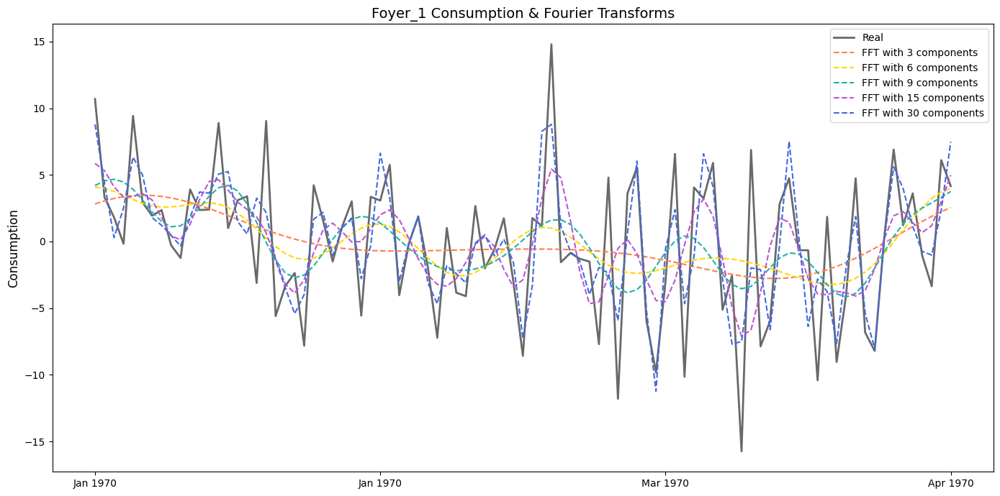

In [22]:
# Select relevant columns from df_day
selected_columns = ['Day', 'appartement_1', 'appartement_10', 'appartement_20']
data_FT = df_day[selected_columns]

# Perform FFT (Fast Fourier Transform) on 'appartement_1'
fft_list = np.fft.fft(data_FT['appartement_1'].values)

# Create a figure with a larger size and higher resolution
plt.figure(figsize=(14, 7), dpi=100)

# Plot the original data with a solid line in a muted color
plt.plot(data_FT['Day'], data_FT['appartement_1'], label='Real', color='dimgray', linewidth=2)

# Plot Fourier transforms with different components in vibrant colors
colors = ['coral', 'gold', 'lightseagreen', 'mediumorchid', 'royalblue']

for num_components, color in zip([3, 6, 9, 15, 30], colors):
    fft_list_filtered = np.copy(fft_list)
    fft_list_filtered[num_components:-num_components] = 0
    reconstructed_data = np.fft.ifft(fft_list_filtered).real
    plt.plot(data_FT['Day'], reconstructed_data, label=f'FFT with {num_components} components', color=color, linestyle='dashed', linewidth=1.5)

# Customize plot labels and title
plt.ylabel('Consumption', fontsize=12)
plt.title('Foyer_1 Consumption & Fourier Transforms', fontsize=14)
plt.legend(fontsize=10)

# Format x-axis ticks as months
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(30))  # Set major ticks every 30 days
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format tick labels as abbreviated month and year

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

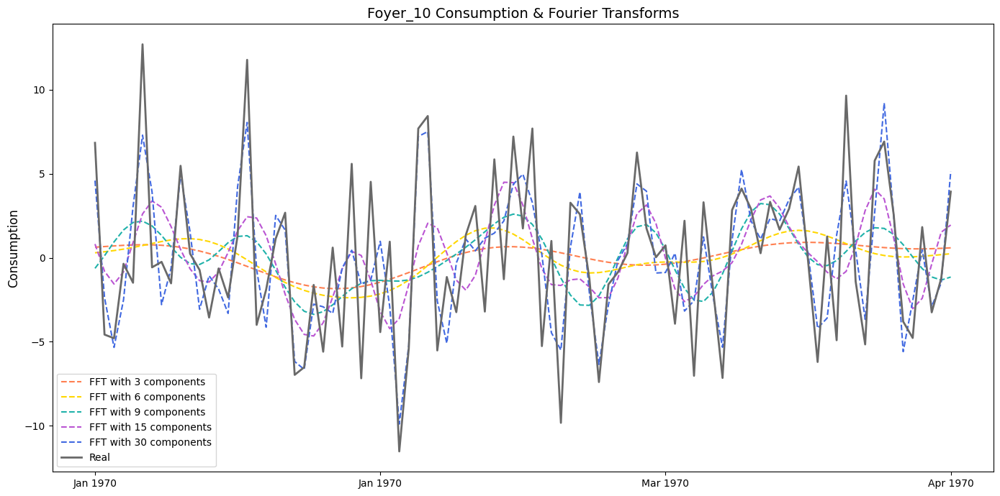

In [23]:
# Perform FFT (Fast Fourier Transform) on 'appartement_10'
appt10_fft = np.fft.fft(data_FT['appartement_10'].values)
fft_df = pd.DataFrame({'fft': appt10_fft})

# Calculate absolute and angle values from FFT results
fft_df['absolute'] = np.abs(fft_df['fft'])
fft_df['angle'] = np.angle(fft_df['fft'])

# Create a figure with a larger size and higher resolution
plt.figure(figsize=(14, 7), dpi=100)

# Plot Fourier transforms with different components in vibrant colors
colors = ['coral', 'gold', 'lightseagreen', 'mediumorchid', 'royalblue']

for num_components, color in zip([3, 6, 9, 15, 30], colors):
    fft_list_m10 = np.copy(fft_df['fft'])
    fft_list_m10[num_components:-num_components] = 0
    reconstructed_data = np.fft.ifft(fft_list_m10).real
    plt.plot(data_FT['Day'], reconstructed_data, label=f'FFT with {num_components} components', color=color, linestyle='dashed', linewidth=1.5)

# Plot the real data with a solid line in a muted color
plt.plot(data_FT['Day'], data_FT['appartement_10'], label='Real', color='dimgray', linewidth=2)

# Customize plot labels and title
plt.ylabel('Consumption', fontsize=12)
plt.title('Foyer_10 Consumption & Fourier Transforms', fontsize=14)
plt.legend(fontsize=10)

# Format x-axis ticks as months
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(30))  # Set major ticks every 30 days
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format tick labels as abbreviated month and year

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

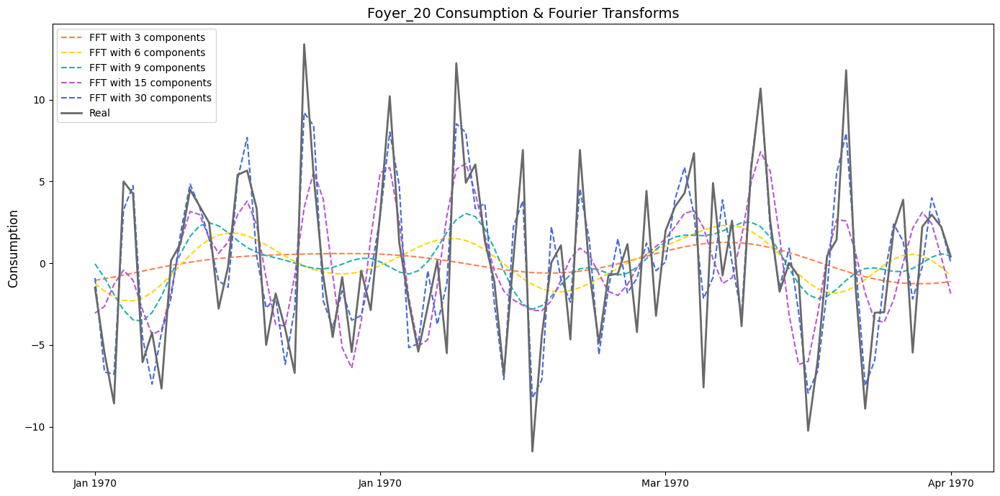

In [24]:
# Perform FFT (Fast Fourier Transform) on 'appartement_20'
appt20_fft = np.fft.fft(data_FT['appartement_20'].values)
fft_df = pd.DataFrame({'fft': appt20_fft})

# Calculate absolute and angle values from FFT results
fft_df['absolute'] = np.abs(fft_df['fft'])
fft_df['angle'] = np.angle(fft_df['fft'])

# Create a figure with a larger size and higher resolution
plt.figure(figsize=(14, 7), dpi=100)

# Plot Fourier transforms with different components in vibrant colors
colors = ['coral', 'gold', 'lightseagreen', 'mediumorchid', 'royalblue']

for num_components, color in zip([3, 6, 9, 15, 30], colors):
    fft_list_m20 = np.copy(fft_df['fft'])
    fft_list_m20[num_components:-num_components] = 0
    reconstructed_data = np.fft.ifft(fft_list_m20).real
    plt.plot(data_FT['Day'], reconstructed_data, label=f'FFT with {num_components} components', color=color, linestyle='dashed', linewidth=1.5)

# Plot the real data with a solid line in a muted color
plt.plot(data_FT['Day'], data_FT['appartement_20'], label='Real', color='dimgray', linewidth=2)

# Customize plot labels and title
plt.ylabel('Consumption', fontsize=12)
plt.title('Foyer_20 Consumption & Fourier Transforms', fontsize=14)
plt.legend(fontsize=10)

# Format x-axis ticks as months
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(30))  # Set major ticks every 30 days
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))  # Format tick labels as abbreviated month and year

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

The Fourier Transform utilizes numerous spectral components to attempt to shape the data. From the time domain, they are converted into the frequency domain and then computed. After that, the transformed data is converted back into the time domain, where it is plotted. The Fourier Transform, as an indicator, helps extract the predominant cycle in a data series.
)

In the examples above, we can observe that the spectral component of 30 is the closest to the actual consumption, so we will proceed with 30.

In [25]:
def get_fourier(dataset, num_components=30):
    df_copy = dataset.copy()
    num_appt = 0
    fft_columns = []

    for column in dataset.columns[1:]:
        num_appt += 1
        # Perform FFT (Fast Fourier Transform) on the current column
        close_fft = np.fft.fft(np.asarray(dataset[column].tolist()))
        close_fft = np.fft.ifft(close_fft)
        
        # Create a DataFrame to store FFT results
        fft_df = pd.DataFrame({'fft': close_fft})
        fft_df['absolute'] = np.abs(fft_df['fft'])
        fft_df['angle'] = np.angle(fft_df['fft'])
        
        # Filter FFT components and store them in a list
        fft_list = np.asarray(fft_df['fft'].tolist())
        fft_list_filtered = np.copy(fft_list)
        fft_list_filtered[num_components:-num_components] = 0
        col_name = f'Fourier_{num_appt}'
        fft_columns.append(pd.DataFrame(fft_list_filtered).apply(lambda x: np.abs(x)))

    # Concatenate all FFT columns to the DataFrame
    df_copy = pd.concat([df_copy] + fft_columns, axis=1)

    return df_copy

dataset = df_day.copy()
dataset_TI_df = get_fourier(dataset)
dataset_TI_df.head()

,Day,appartement_1,appartement_2,appartement_3,appartement_4,appartement_5,appartement_6,appartement_7,appartement_8,appartement_9,...,0,0,0,0,0,0,0,0,0,0
0,2023-01-01,10.695612,2.707761,1.647498,-5.904153,-2.661249,0.654775,-1.157198,-2.259596,2.908255,...,3.991519,1.734392,0.876962,2.435284,1.460960,7.802755,5.488774,2.512723,0.038179,1.193993
1,2023-01-02,3.317783,0.418042,0.443568,3.828257,1.062960,1.491268,-0.203413,0.929008,8.298131,...,2.156356,1.475652,1.986360,1.328565,3.933832,1.167473,2.837245,2.296679,0.674502,0.483624
2,2023-01-03,1.816731,-3.906145,2.425824,-3.463101,-2.683973,11.444573,0.517418,0.066906,1.924546,...,12.081914,4.045812,3.777372,3.555868,1.854796,6.746188,6.590368,1.203642,1.757036,4.484738
3,2023-01-04,-0.170942,0.755987,0.070307,-1.734172,4.439202,6.108568,-5.108810,2.151468,4.823757,...,0.404964,2.223912,1.802795,4.237884,7.549328,0.063060,10.240349,8.447088,0.233395,6.750551
4,2023-01-05,9.427071,0.170686,1.081296,1.078066,-1.972080,-5.661369,3.067871,1.375589,-5.263518,...,3.896672,1.863383,3.898508,5.057182,4.731564,7.866515,1.337738,4.375373,2.891689,5.147485


# **4. Clustering 🧩**

### **4.1 Hierarchical Clustering 🌳**

We start with hierarchical clustering. The advantage of such a technique is that we can decide where to cut the dendrogram to obtain groups of the desired size.

####  **a- Feature Extraction-based Methods**

To assess our results, we use the Calinski-Harabasz index.

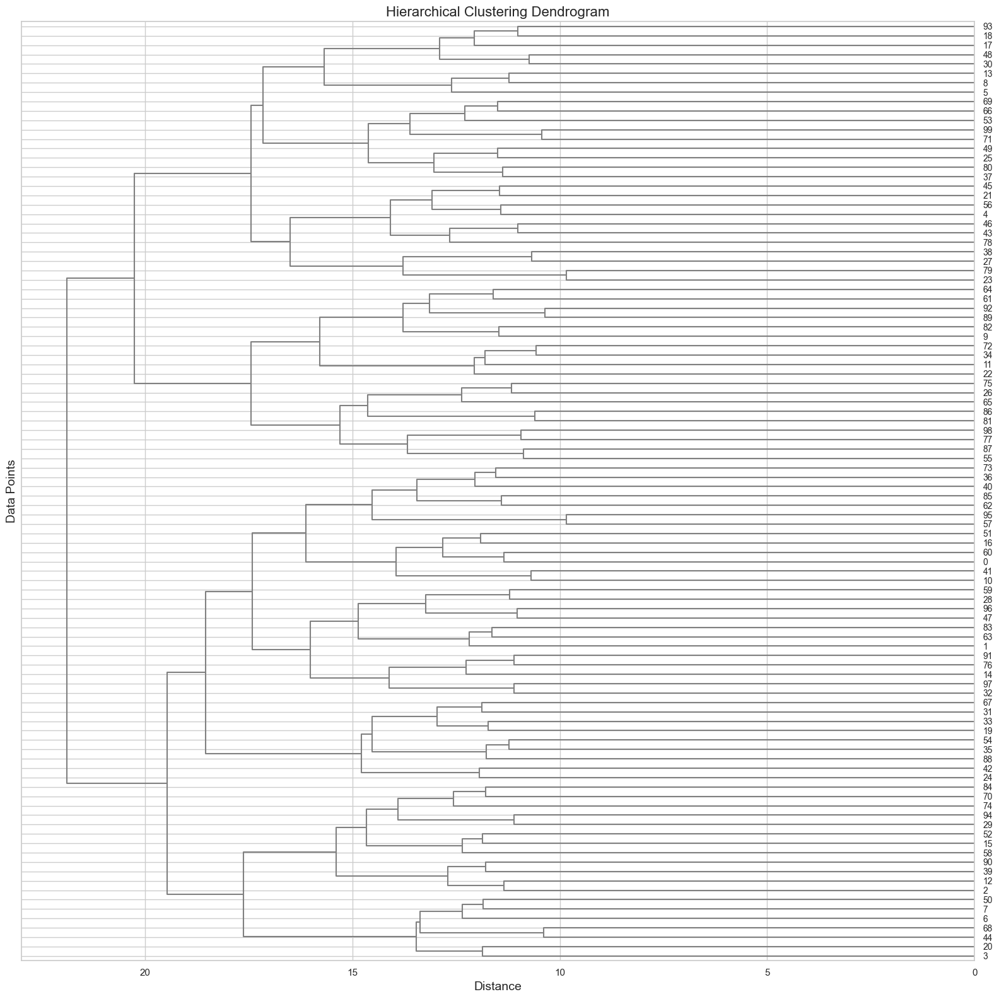

Calinski-Harabasz Index: 2.574033948513547
Cluster
1    53
3    28
2    19
Name: count, dtype: int64 ACP 3


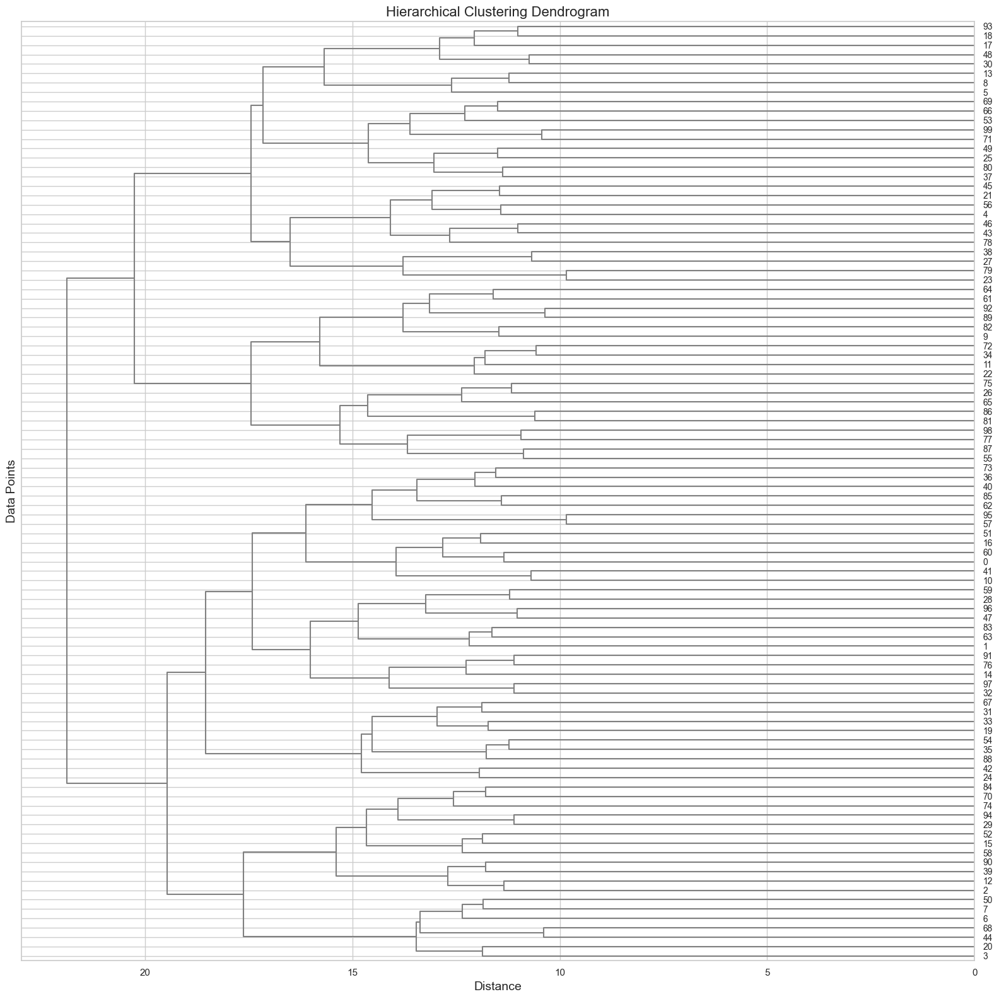

Calinski-Harabasz Index: 2.7891164020785926
Cluster
1    53
2    47
Name: count, dtype: int64 ACP 2


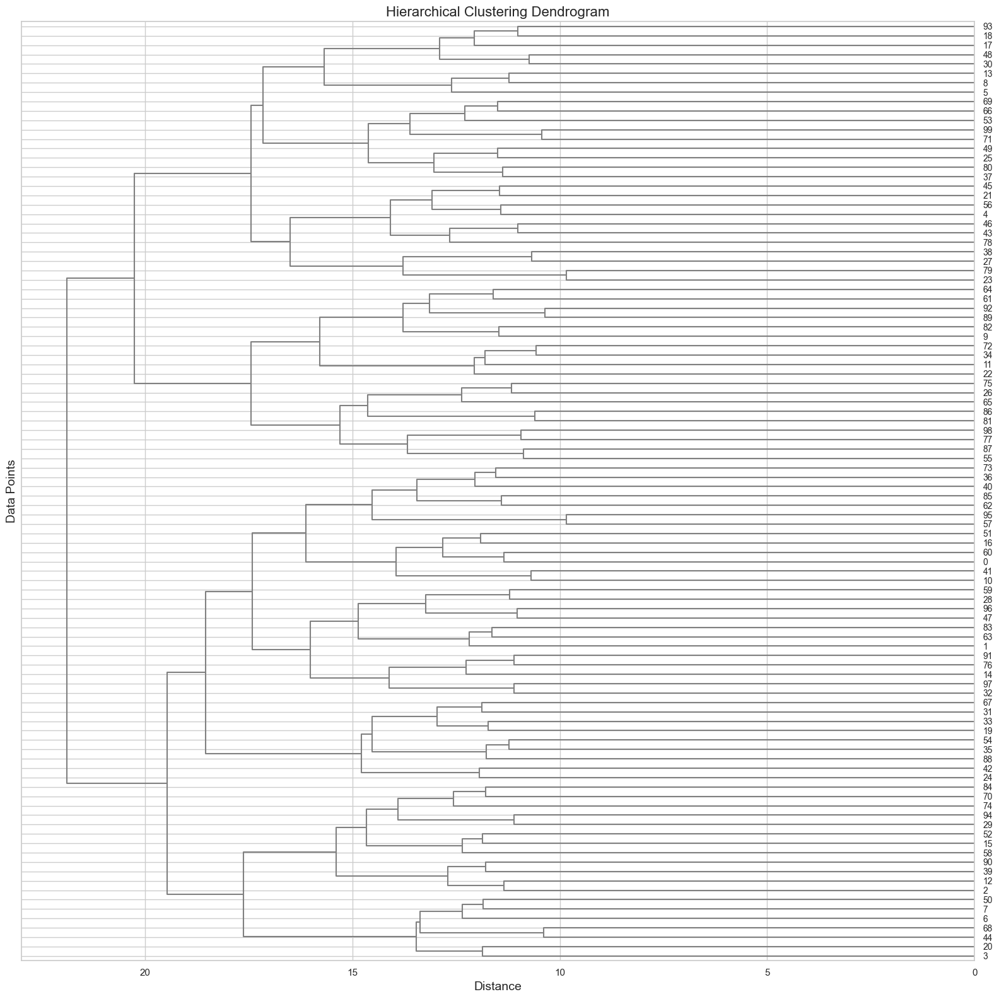

Calinski-Harabasz Index: 2.172401939603109
Cluster
4    25
5    19
7    17
2    12
6    11
3     9
1     7
Name: count, dtype: int64 ACP 7


In [26]:
def CAH(df_reduced, k, dataframe, method_eval_scale=False):
    """
    Perform hierarchical clustering analysis on the given DataFrame.

    Parameters:
    - df_reduced (pd.DataFrame): The DataFrame containing the reduced data.
    - k (int): The number of clusters.
    - dataframe (bool): If True, return a DataFrame with cluster labels; otherwise, return cluster counts.
    - method_eval_scale (bool): If True, use scaled data for clustering.

    Returns:
    - pd.DataFrame or pd.Series: Depending on the 'dataframe' parameter, it returns either a DataFrame with cluster labels or a Series with cluster counts.
    """

    # Set seaborn style for better aesthetics
    sns.set(style="whitegrid")

    if method_eval_scale:
        df_compare = df_scaled  # Assuming df_scaled is defined elsewhere
    else:
        df_compare = df_day[df_day.columns[1:]].transpose()

    # Hierarchical clustering
    Z = linkage(df_reduced, method="ward", metric="euclidean")
    
    # Plot dendrogram
    plt.figure(figsize=(16, 16))
    plt.title("Hierarchical Clustering Dendrogram", fontsize=16)
    dendrogram(Z, orientation="left", color_threshold=3, above_threshold_color='#808080', leaf_font_size=10)
    plt.xlabel('Distance', fontsize=14)
    plt.ylabel('Data Points', fontsize=14)
    plt.tight_layout()
    plt.show()

    # Assigning cluster labels
    groupes_cah = fcluster(Z, t=k, criterion="maxclust")
    df_cah_1 = pd.DataFrame(groupes_cah, columns=['Cluster'])
    df_cah_1["ID"] = df_cah_1.index

    # Calinski-Harabasz score
    ch_score = calinski_harabasz_score(X=df_compare, labels=df_cah_1['Cluster'])
    print("Calinski-Harabasz Index:", ch_score)

    return df_cah_1['Cluster'].value_counts()

# Example usage:
for k in [3, 2, 7]:
    print(CAH(df_acp, k, False), "ACP", k)

#### **b- Direct Method**

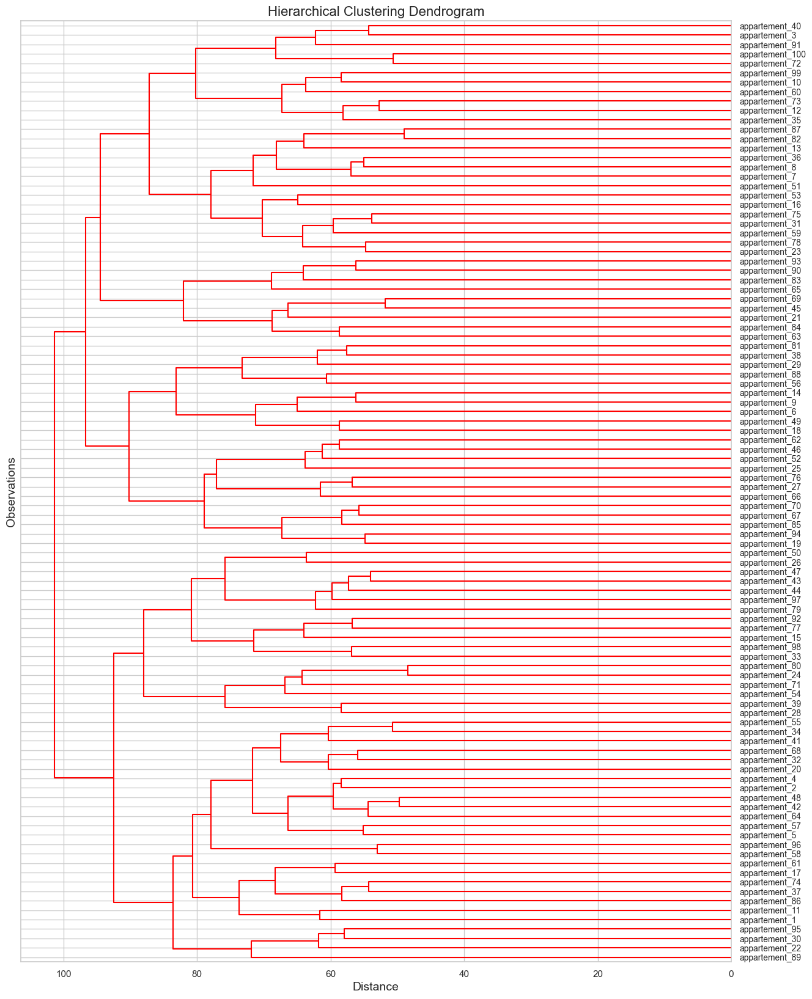

In [27]:
# Generate the linkage matrix
Z = linkage(df_day[df_day.columns[1:]].transpose(), method="ward", metric="euclidean")

# Set up the figure
plt.figure(figsize=(15, 20))  # Adjust the figure size for better visibility

# Plot the dendrogram
dendrogram(
    Z,
    labels=df_day[df_day.columns[1:]].transpose().index,
    orientation="left",
    color_threshold=0,
    leaf_rotation=0,  # Rotate the labels for better readability
    leaf_font_size=10,  # Adjust font size
    above_threshold_color="red",  # Color for non-cluster nodes
    # truncate_mode="lastp",  # Display only the last p non-singleton clusters in the linkage matrix
    show_contracted=True,  # Display contracted clusters
)

# Customize the plot
plt.title("Hierarchical Clustering Dendrogram", fontsize=16)
plt.xlabel("Distance", fontsize=14)
plt.ylabel("Observations", fontsize=14)
plt.axvline(x=500, linestyle="--", color="gray", linewidth=2)  # Add a vertical line for cutting clusters

# Display the plot
plt.show()

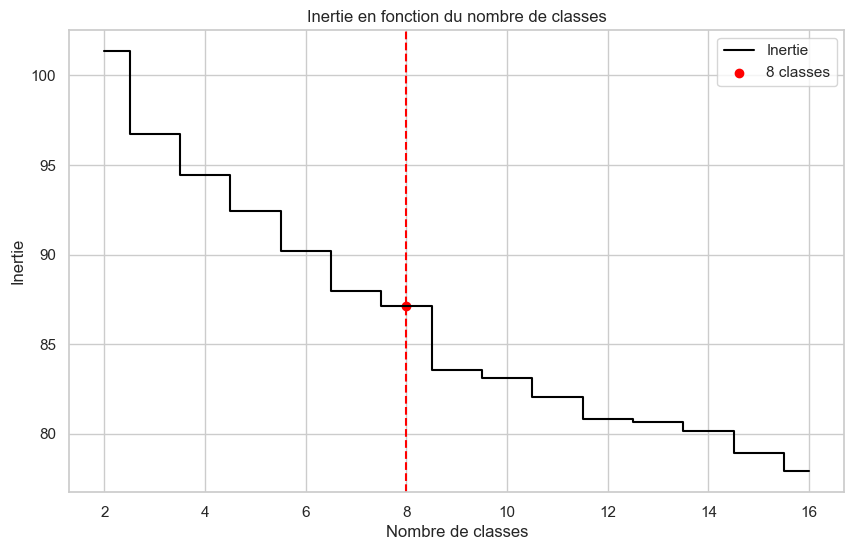

In [28]:
last = Z[-15:, 2]
last_rev = last[::-1]
idxs = np.arange(2, len(last) + 2)

plt.figure(figsize=(10, 6))  # Adjust the figure size for better visibility

# Plotting the step chart
plt.step(idxs, last_rev, where='mid', color="black", label="Inertie")

# Highlight the specific point (e.g., for 8 clusters)
nombre = 8
plt.scatter(nombre, last_rev[np.where(idxs == nombre)], c="red", marker='o', label=f"{nombre} classes")

# Vertical line at the highlighted point
plt.axvline(nombre, c="red", linestyle='--')

# Adding labels and title
plt.xlabel("Nombre de classes")
plt.ylabel("Inertie")
plt.title("Inertie en fonction du nombre de classes")

# Adding a legend
plt.legend()

# Display the plot
plt.show()

On this graph, we observe two significant jumps in inertia for 2 and 8 clusters. This strongly suggests that a segmentation into 2 or 8 clusters would be relevant, but not beyond that!

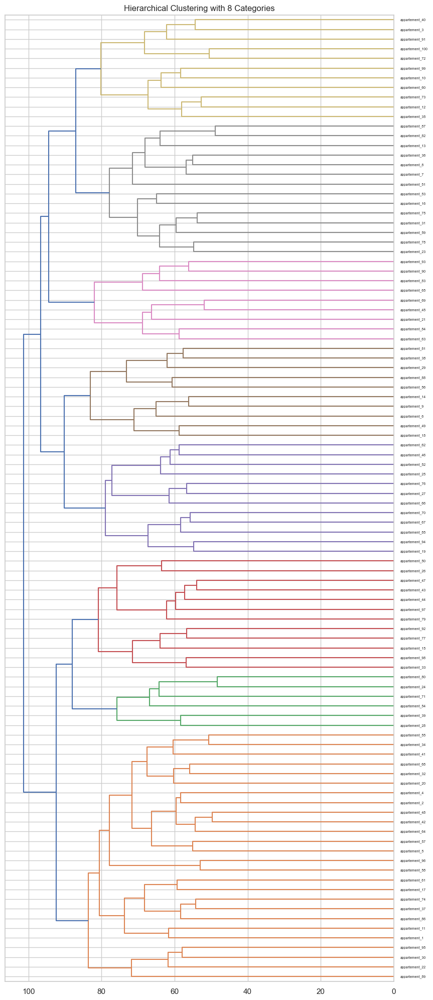

Cluster Labels: [1 1 8 1 1 5 7 7 5 8 1 8 7 5 3 7 1 5 4 1 6 1 7 2 4 3 4 2 5 1 7 1 3 1 8 7 1
 5 2 8 1 1 3 3 6 4 3 1 5 3 7 4 7 2 1 5 1 1 7 8 1 4 6 1 6 4 4 1 6 4 2 8 8 1
 7 4 3 7 3 2 5 7 6 6 4 1 7 5 1 6 8 3 6 4 1 1 3 3 8 8]


In [29]:
def visualize_cah(df, Z, height_threshold=85):
    """
    Visualize the hierarchical clustering with category delineation.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - Z (ndarray): The linkage matrix obtained from hierarchical clustering.
    - height_threshold (float): The threshold for color differentiation.

    Returns:
    - list: A list of cluster labels.
    """
    # Materialize the 8 categories (height t = 85)
    plt.figure(figsize=(10, 25))
    plt.title("Hierarchical Clustering with 8 Categories")

    dendrogram(
        Z,
        labels=df.transpose().index,
        orientation="left",
        color_threshold=height_threshold,
    )

    plt.show()

    # Cut the tree at height t = 85 to obtain groups
    groupes_cah = fcluster(Z, t=height_threshold, criterion="distance")

    print("Cluster Labels:", groupes_cah)

    return groupes_cah

# Example usage:
# Replace df_day with your actual DataFrame
# Replace Z with your linkage matrix
group_labels = visualize_cah(df_day[df_day.columns[1:]], Z, height_threshold=85)

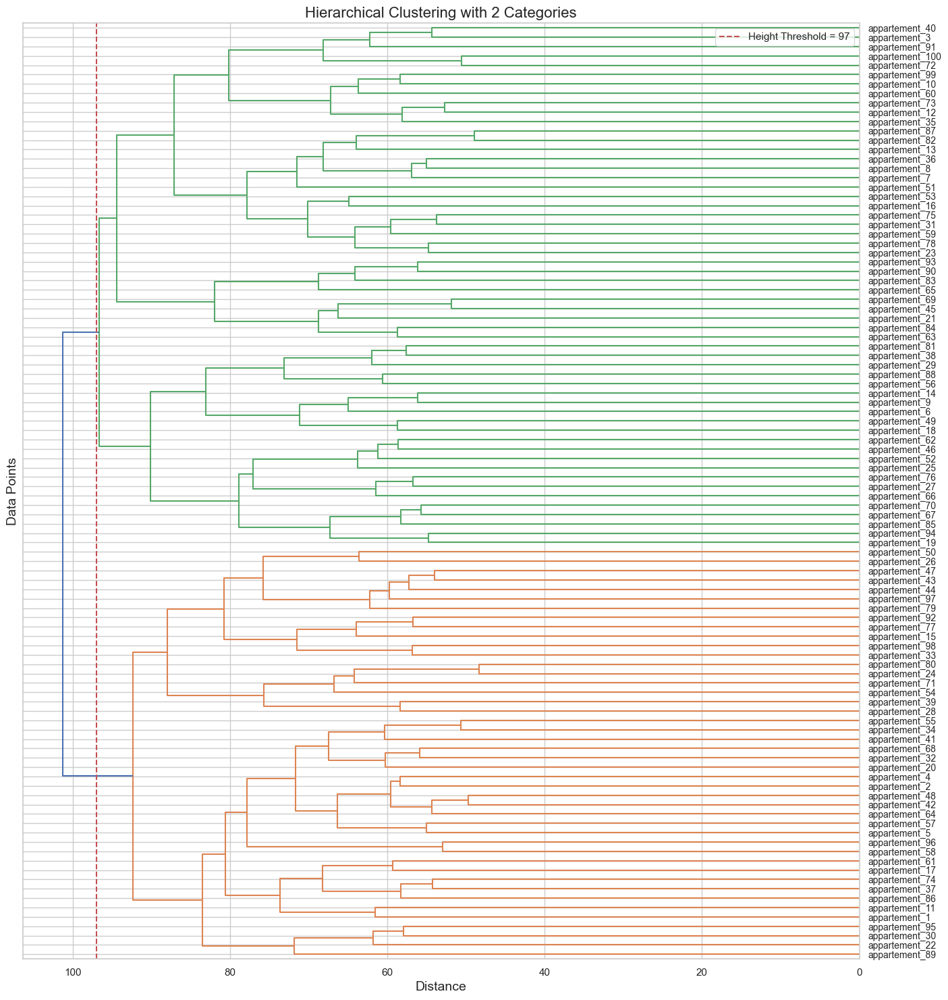

Cluster Labels: [1 1 2 1 1 2 2 2 2 2 1 2 2 2 1 2 1 2 2 1 2 1 2 1 2 1 2 1 2 1 2 1 1 1 2 2 1
 2 1 2 1 1 1 1 2 2 1 1 2 1 2 2 2 1 1 2 1 1 2 2 1 2 2 1 2 2 2 1 2 2 1 2 2 1
 2 2 1 2 1 1 2 2 2 2 2 1 2 2 1 2 2 1 2 2 1 1 1 1 2 2]


In [30]:
def visualize_cah(df, Z, num_categories=2, height_threshold=None):
    """
    Visualize the hierarchical clustering with category delineation.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - Z (ndarray): The linkage matrix obtained from hierarchical clustering.
    - num_categories (int): The number of categories to visualize.
    - height_threshold (float): The threshold for color differentiation.

    Returns:
    - list: A list of cluster labels.
    """
    # Materialize the specified number of categories
    plt.figure(figsize=(16, 18))
    plt.title(f"Hierarchical Clustering with {num_categories} Categories", fontsize=16)

    dendrogram(
        Z,
        labels=df.transpose().index,
        orientation="left",
        color_threshold=height_threshold,
    )

    # Add labels and legend
    plt.xlabel('Distance', fontsize=14)
    plt.ylabel('Data Points', fontsize=14)
    plt.axvline(x=height_threshold, color='r', linestyle='--', label=f'Height Threshold = {height_threshold}')
    plt.legend()

    # Adjust y-axis labels for better readability
    plt.yticks(fontsize=10)

    plt.show()

    # Cut the tree at the specified height to obtain groups
    groupes_cah = fcluster(Z, t=height_threshold, criterion="distance")

    print("Cluster Labels:", groupes_cah)

    return groupes_cah

# Example usage:
# Replace df_day with your actual DataFrame
# Replace Z with your linkage matrix
# Specify the number of categories and the height threshold
group_labels = visualize_cah(df_day[df_day.columns[1:]], Z, num_categories=2, height_threshold=97)

### **4.2 K-means 🎯**

K-Means is one of the most popular clustering algorithms due to its efficiency and scalability. In particular, we can always specify the number of clusters we want to obtain. Let's try to determine the optimal number of clusters for each of our dataframe derivatives.

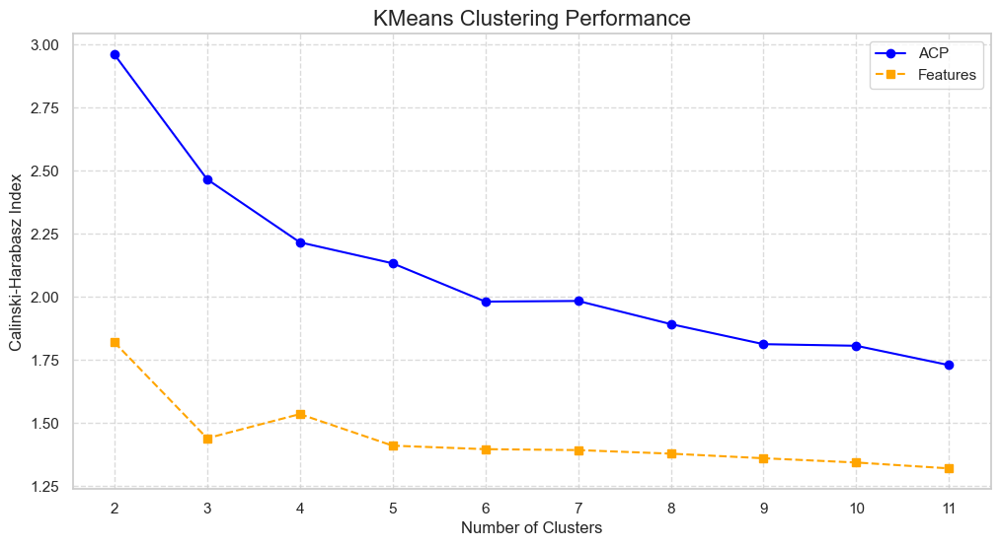

In [31]:
def perform_kmeans(data, k, print_groupe=False, method_eval_scale=False):
    """
    Perform KMeans clustering on the given data.

    Parameters:
    - data (pd.DataFrame): The data to be clustered.
    - k (int): The number of clusters.
    - print_groupe (bool): If True, return cluster labels; otherwise, return the Calinski-Harabasz index.
    - method_eval_scale (bool): If True, use scaled data for clustering.

    Returns:
    - pd.Series or float: Depending on the evaluation method, it returns either a Series with cluster labels or the Calinski-Harabasz index.
    """
    if method_eval_scale:
        df_compare = df_scaled  # Assuming df_scaled is defined elsewhere
    else:
        df_compare = df_day[df_day.columns[1:]].transpose()

    # Initialize and fit KMeans with explicit n_init
    cluster = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster.fit(data)

    # Get cluster labels
    results = pd.Series(cluster.predict(data))

    # Calculate Calinski-Harabasz index
    indice = calinski_harabasz_score(df_compare, results)

    return results if print_groupe else indice

# Perform KMeans clustering for different values of k
cluster_results_acp = [perform_kmeans(df_acp, i, print_groupe=False, method_eval_scale=False) for i in range(2, 12)]
cluster_results_features = [perform_kmeans(df_features, i, print_groupe=False, method_eval_scale=False) for i in range(2, 12)]

# Plot the results with enhanced visualization
plt.figure(figsize=(12, 6))
plt.plot(range(2, 12), cluster_results_acp, marker='o', label="ACP", linestyle='-', color='blue')
plt.plot(range(2, 12), cluster_results_features, marker='s', label="Features", linestyle='--', color='orange')
plt.legend()
plt.xlabel("Number of Clusters", fontsize=12)
plt.ylabel("Calinski-Harabasz Index", fontsize=12)
plt.title("KMeans Clustering Performance", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(range(2, 12))
plt.show()

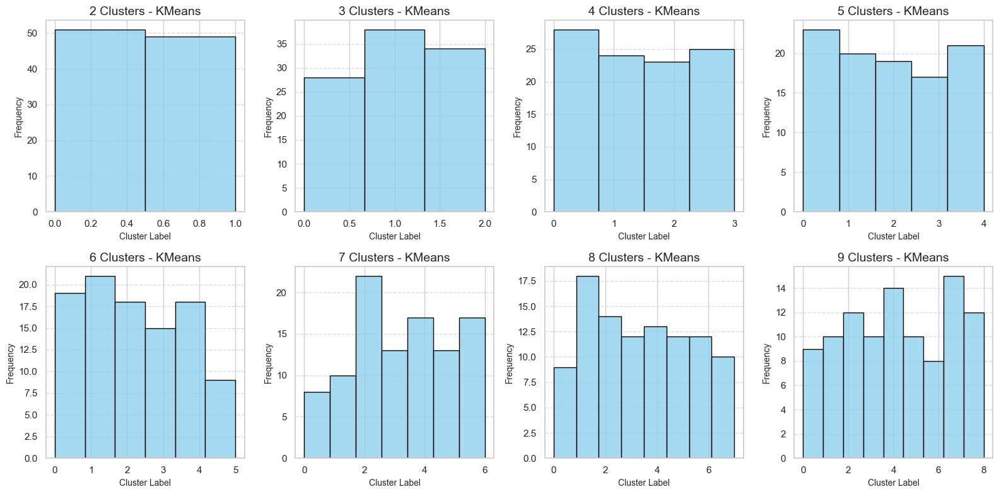

In [32]:
def visualize_kmeans_clusters(data, k, subplot_position):
    """
    Visualize the distribution of cluster labels for KMeans.

    Parameters:
    - data (pd.DataFrame): The data used for clustering.
    - k (int): The number of clusters.
    - subplot_position (int): The position of the subplot in the grid.

    Returns:
    - None: Displays the histogram of cluster labels.
    """
    # Explicitly set n_init to suppress the warning
    cluster = KMeans(n_clusters=k, random_state=42, n_init=10)
    
    # Perform KMeans clustering
    cluster_labels = cluster.fit_predict(data)

    # Create subplots
    plt.subplot(2, 4, subplot_position)

    # Plot histogram
    sns.histplot(cluster_labels, bins=k, kde=False, color='skyblue', edgecolor='black')
    
    plt.title("{} Clusters - KMeans".format(k), fontsize=14)
    plt.xlabel("Cluster Label", fontsize=10)
    plt.ylabel("Frequency", fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

# Create a 2x4 grid for subplots
plt.figure(figsize=(16, 8))

# Visualize clusters for different values of k
for i, num_clusters in enumerate([2, 3, 4, 5, 6, 7, 8, 9], 1):
    visualize_kmeans_clusters(df_acp, num_clusters, i)

plt.tight_layout()
plt.show()


### **4.3 SOM - Self-Organizing Map 🗺️**
 
Self-Organizing Maps (SOMs) are a type of neural network trained using unsupervised learning to produce a low-dimensional representation of the input space from training samples, referred to as a map.
![Alt Text](https://www.latentview.com/wp-content/uploads/2020/09/blog-5.jpg)

<center>Source : Google: <a href="https://www.latentview.com/wp-content/uploads/2020/09/blog-5.jpg">landing.png</a></center>

<br>    
Self-Organizing Maps also differ from other artificial neural networks as they employ competitive (or cooperative) learning, as opposed to error-correction learning (such as backpropagation with gradient descent). Additionally, they use a neighborhood function to preserve the topological properties of the input space.

<br>
Due to its ability to produce a map, SOM is considered a dimensionality reduction method. However, in our case, when each SOM node is accepted as the medoid of the cluster, we can use it for clustering. To do this, we need to remove the time indices from our time series. Instead of the measured values for each date, we should consider them as different features and dimensions of a single data point.

Pour l'implémentation de l'algorithme som, on a utilisé miniSom et défini nos paramètres comme suit :

- sigma : 0.3
- taux d'apprentissage : 0.5
- initialisation aléatoire des poids
- 50.000 itérations
- Taille de la carte : racine carrée du nombre de séries


In [33]:
df_day.head()

,Day,appartement_1,appartement_2,appartement_3,appartement_4,appartement_5,appartement_6,appartement_7,appartement_8,appartement_9,...,appartement_91,appartement_92,appartement_93,appartement_94,appartement_95,appartement_96,appartement_97,appartement_98,appartement_99,appartement_100
0,2023-01-01,10.695612,2.707761,1.647498,-5.904153,-2.661249,0.654775,-1.157198,-2.259596,2.908255,...,-3.991519,-1.734392,0.876962,-2.435284,-1.460960,-7.802755,-5.488774,2.512723,0.038179,1.193993
1,2023-01-02,3.317783,0.418042,0.443568,3.828257,1.062960,1.491268,-0.203413,0.929008,8.298131,...,2.156356,-1.475652,-1.986360,-1.328565,-3.933832,-1.167473,-2.837245,2.296679,-0.674502,-0.483624
2,2023-01-03,1.816731,-3.906145,2.425824,-3.463101,-2.683973,11.444573,0.517418,0.066906,1.924546,...,-12.081914,-4.045812,3.777372,-3.555868,1.854796,-6.746188,-6.590368,-1.203642,1.757036,-4.484738
3,2023-01-04,-0.170942,0.755987,0.070307,-1.734172,4.439202,6.108568,-5.108810,2.151468,4.823757,...,0.404964,2.223912,1.802795,4.237884,-7.549328,0.063060,-10.240349,8.447088,0.233395,6.750551
4,2023-01-05,9.427071,0.170686,1.081296,1.078066,-1.972080,-5.661369,3.067871,1.375589,-5.263518,...,-3.896672,-1.863383,3.898508,5.057182,4.731564,7.866515,1.337738,-4.375373,2.891689,5.147485


In [34]:
mySeries = []
for i in df.columns[1:].to_list():
    df1 = df_day.loc[:, ["Day", str(i)]]
    # While we are at it I just filtered the columns that we will be working on
    df1.set_index("Day", inplace=True)
    # ,set the date columns as index
    df1.sort_index(inplace=True)
    # and lastly, ordered the data according to our date index
    mySeries.append(df1)

for i in range(len(mySeries)):
    scaler = MinMaxScaler()
    mySeries[i] = MinMaxScaler().fit_transform(mySeries[i])
    mySeries[i] = mySeries[i].reshape(len(mySeries[i]))

In [35]:
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(mySeries))))
# we didn't see its significance but to make the map square,
# we calculated square root of map size which is
# the square root of the number of series
# for the row and column counts of som

som = MiniSom(som_x, som_y, len(mySeries[0]), sigma=0.5, learning_rate=0.5)

som.random_weights_init(mySeries)
som.train(mySeries, 100000)

#### Results

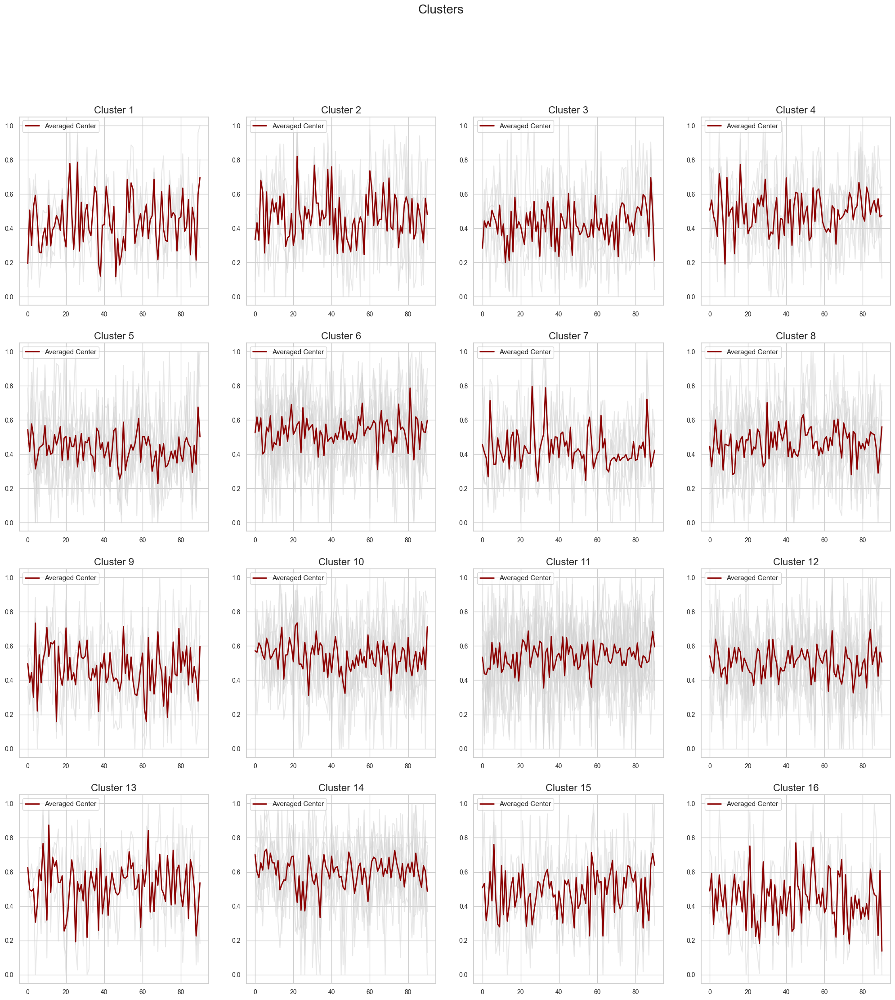

In [36]:
def plot_som_series_averaged_center(som_x, som_y, win_map):
    """
    Plot SOM cluster series and their averaged centers.

    Parameters:
    - som_x (int): Number of SOM grid rows.
    - som_y (int): Number of SOM grid columns.
    - win_map (dict): Mapping of the winner nodes and inputs.

    Returns:
    - None: Displays the plot.
    """
    fig, axs = plt.subplots(som_x, som_y, figsize=(25, 25))
    fig.suptitle("Clusters", fontsize=20)

    for x in range(som_x):
        for y in range(som_y):
            cluster = (x, y)
            if cluster in win_map.keys():
                # Plot individual series in a lighter color
                for series in win_map[cluster]:
                    axs[cluster].plot(series, c="lightgray", alpha=0.5)

                # Plot the averaged center in a bold red line
                axs[cluster].plot(
                    np.average(np.vstack(win_map[cluster]), axis=0), c="darkred", linewidth=2, label="Averaged Center"
                )

                cluster_number = x * som_y + y + 1
                axs[cluster].set_title(f"Cluster {cluster_number}", fontsize=16)
                axs[cluster].legend(loc="upper left")

                # Improve readability of y-axis labels
                axs[cluster].tick_params(axis='both', which='major', labelsize=10)
                axs[cluster].tick_params(axis='both', which='minor', labelsize=8)

    plt.show()

# Assuming som_x, som_y, and som are defined
win_map = som.win_map(mySeries)  # Returns the mapping of the winner nodes and inputs
plot_som_series_averaged_center(som_x, som_y, win_map)

As we can observe in the graph below, SOM has perfectly grouped the 100 different time series into 16 clusters.

## Dynamic Barycenter Averaging (DBA)

Dynamic Barycenter Averaging (DBA) stands out as a robust method, leveraging the Dynamic Time Warping (DTW) technique. This approach proves highly effective in extracting the nuanced movement and shape characteristics within a cluster. The subsequent images vividly illustrate the transformative impact of DBA.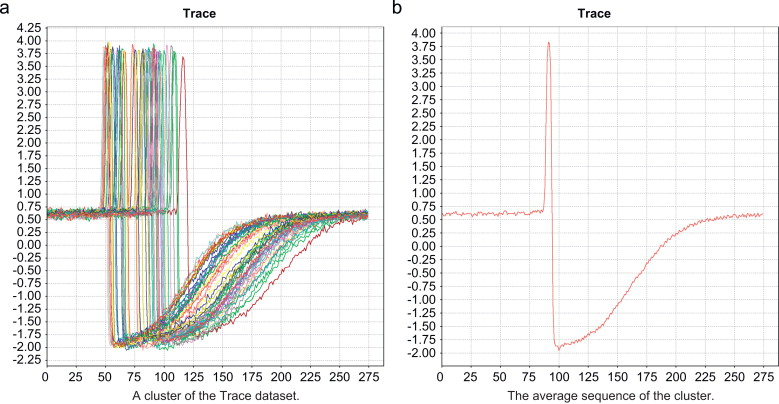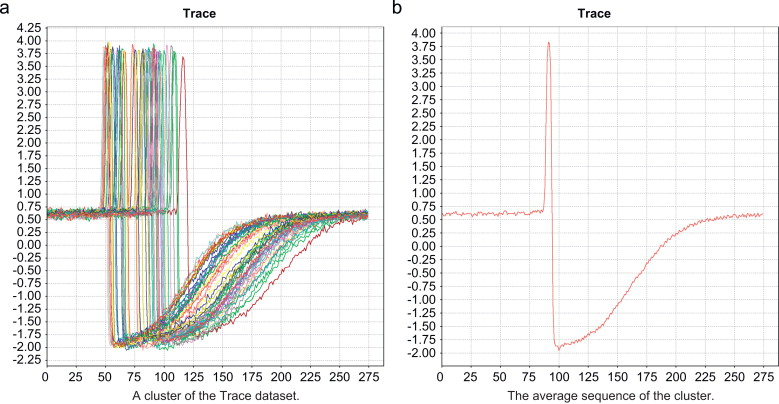ith DTW*

DBA, through its application of DTW, facilitates a comprehensive alignment of time series data points. The resultant barycenter, as depicted in Fig. 2, encapsulates the collective essence of the cluster's movement. This averaged trajectory serves as a powerful representation, offering insights into the shared patterns and trends within ththe cluster.

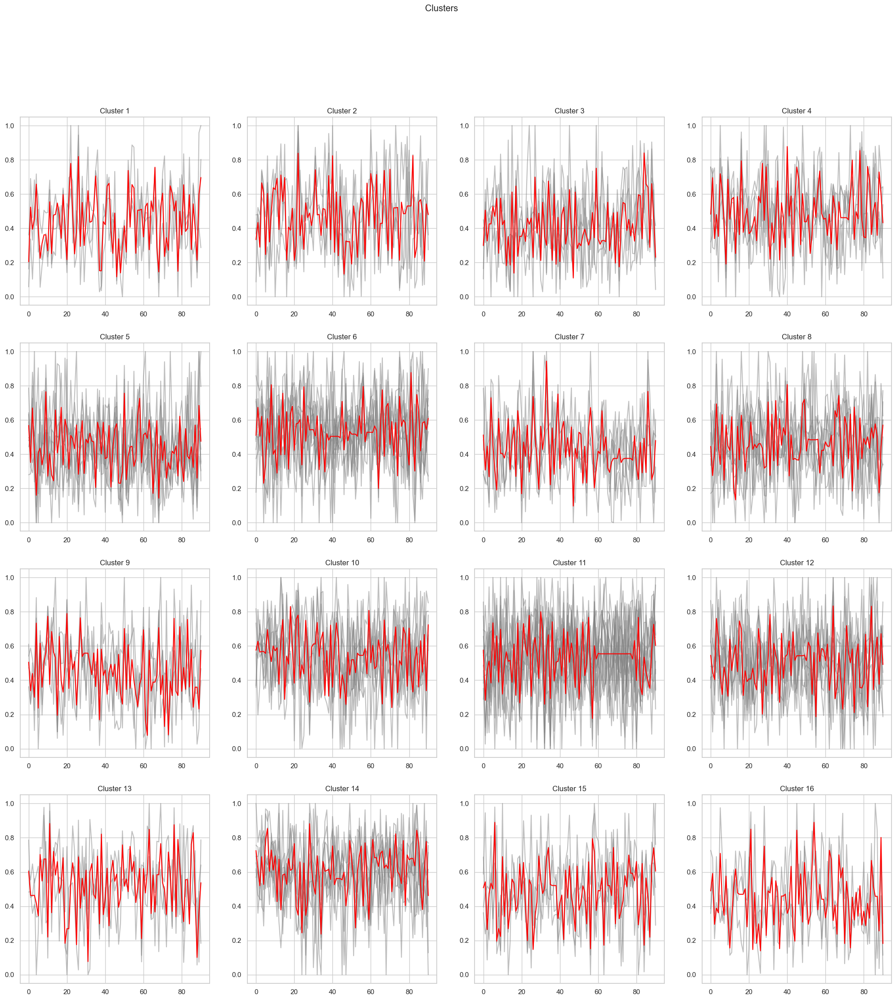

In [37]:
def plot_som_series_dba_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x, som_y, figsize=(25, 25))
    fig.suptitle("Clusters")

    with warnings.catch_warnings(record=True) as w:
        for x in range(som_x):
            for y in range(som_y):
                cluster = (x, y)
                if cluster in win_map:
                    for series in win_map[cluster]:
                        axs[cluster].plot(series, c="gray", alpha=0.5)
                    axs[cluster].plot(
                        dtw_barycenter_averaging(np.vstack(win_map[cluster])), c="red"
                    )
                    cluster_number = x * som_y + y + 1
                    axs[cluster].set_title(f"Cluster {cluster_number}")

    # Display any warnings
    for warning in w:
        warnings.warn(str(warning.message), category=warning.category, stacklevel=1)

    plt.show()

win_map = som.win_map(mySeries)
plot_som_series_dba_center(som_x, som_x, win_map)

We may not see a significant difference with this result, but I highly recommend using this method for this purpose.

#### Cluster Distribution
We can observe the distribution of time series clusters in the following graph.

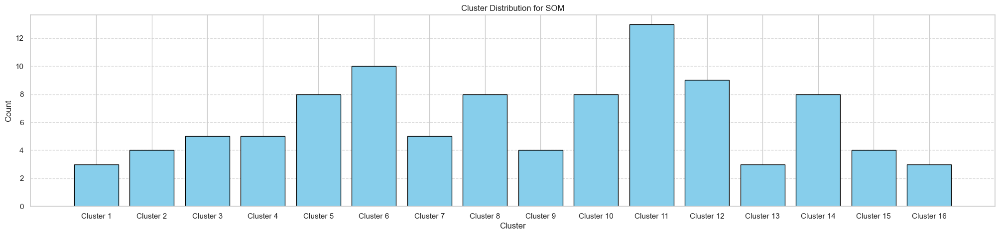

In [38]:
# Initialize lists to store cluster counts and labels
cluster_counts = []
cluster_labels = []

# Iterate through SOM grid
for x in range(som_x):
    for y in range(som_y):
        cluster = (x, y)
        
        # Check if cluster is present in win_map
        if cluster in win_map.keys():
            cluster_counts.append(len(win_map[cluster]))
        else:
            cluster_counts.append(0)
        
        # Calculate cluster number and add to labels
        cluster_number = x * som_y + y + 1
        cluster_labels.append(f"Cluster {cluster_number}")

# Plot the cluster distribution
plt.figure(figsize=(25, 5))
plt.title("Cluster Distribution for SOM")
plt.bar(cluster_labels, cluster_counts, color='skyblue', edgecolor='black')
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### Cluster Mapping


Well, we did cluster our series, but how do we know which series belongs to which cluster? Isn't that the whole purpose of clustering?

As we can see, each node (or multiple nodes in some cases) represents a cluster. Therefore, we can find out which series belongs to which cluster by checking the winning node of each series.

In [39]:
# Let's check first 5
for series in mySeries[:5]:
    print(som.winner(series))

(2, 3)
(2, 3)
(3, 0)
(0, 2)
(3, 3)


In order to make this piece of information more appealing to eye, we can map each node to a number <br>

```e.g. for n*m grid (0,0)=1, (0,1)=2, ... (0,m)=m+1, (1,0)=(m+1)+1, (1,1)=(m+1)+2, ... , (n,m)=(n+1)*(m+1) ``` 

and print the name of the series with the cluster number.

In [40]:
namesofMySeries = df_day.columns[1:].to_list()

In [41]:
cluster_map = []
for idx in range(len(mySeries)):
    winner_node = som.winner(mySeries[idx])
    cluster_map.append(
        (namesofMySeries[idx], f"Cluster {winner_node[0]*som_y+winner_node[1]+1}")
    )

pd.DataFrame(cluster_map, columns=["Series", "Cluster"]).sort_values(
    by="Cluster"
).set_index("Series")

,Cluster
Series,
appartement_58,Cluster 1
appartement_96,Cluster 1
appartement_60,Cluster 1
appartement_21,Cluster 10
appartement_52,Cluster 10
...,...
appartement_37,Cluster 8
appartement_12,Cluster 9
appartement_30,Cluster 9


### K-Means


K-means clustering is a method that aims to group n inputs into k clusters, where each data point belongs to the cluster with the closest mean (cluster centroid). It is one of the most popular and basic clustering algorithms.

<br>

<p align="center">
  <img src="https://assets.blog.code-specialist.com/k_means_animation_6cdd31d106.gif" alt="Training process">
</p>

<br>

To cluster our time series with k-means, the essential step, as we did with SOM, is to remove the time indices from our time series. Instead of the measured values for each date, we should treat them as different features and dimensions of a single data point. Another important step is to select the distance metric. We will use Dynamic Time Warping (DTW).


In [42]:
# Determine the number of clusters using the square root rule
cluster_count = math.ceil(math.sqrt(len(mySeries)))

# Create TimeSeriesKMeans model
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")

# Fit and predict cluster labels
labels = km.fit_predict(mySeries)

#### Results

After training, we visualized the results similarly to our approach with SOM. For each cluster, we plotted all the series with a slight transparency in gray. To capture the movement or shape of the cluster, we calculated the average of the cluster and plotted the average series in red.

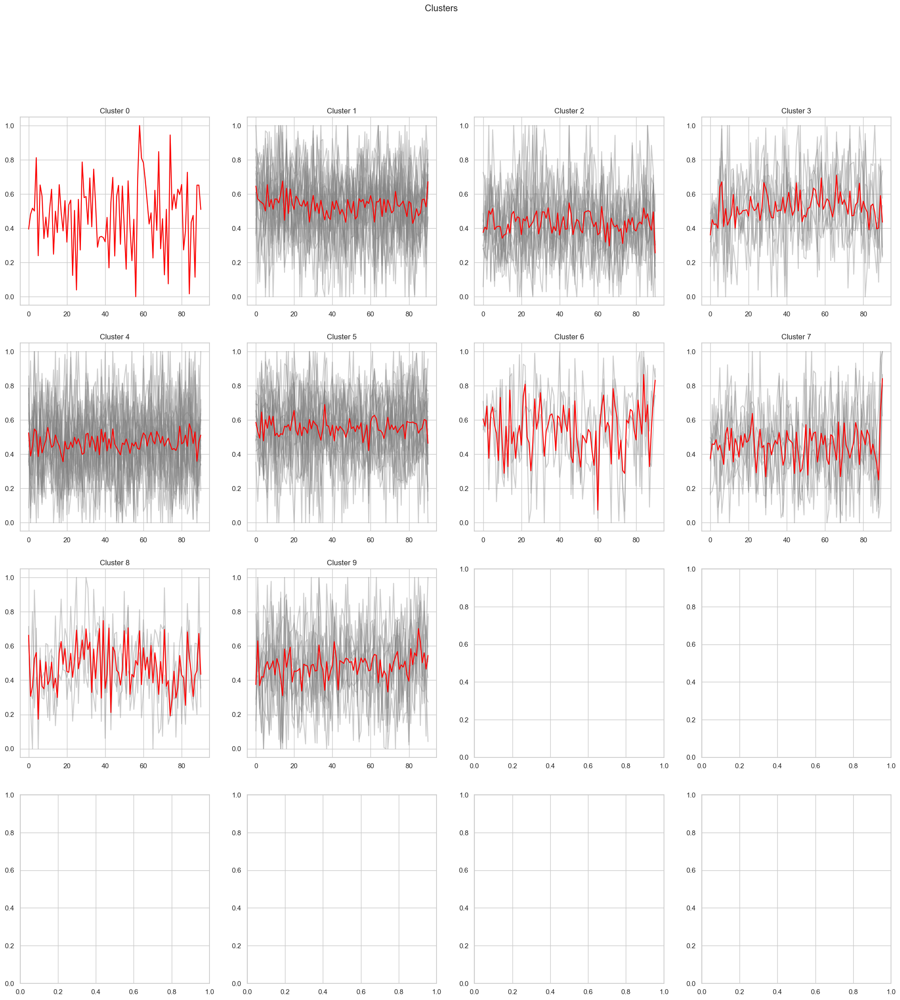

In [43]:
plot_count = math.ceil(math.sqrt(cluster_count))

fig, axs = plt.subplots(plot_count, plot_count, figsize=(25, 25))
fig.suptitle("Clusters")
row_i = 0
column_j = 0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
        if labels[i] == label:
            axs[row_i, column_j].plot(mySeries[i], c="gray", alpha=0.4)
            cluster.append(mySeries[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster), axis=0), c="red")
    axs[row_i, column_j].set_title("Cluster " + str(row_i * som_y + column_j))
    column_j += 1
    if column_j % plot_count == 0:
        row_i += 1
        column_j = 0

plt.show()

As shown in the graph above, the k-means algorithm has grouped the 100 different time series into 10 clusters. One of the clusters contains only a single time series, which can be considered an outlier.

#### Cluster Distribution

We can observe the distribution of time series into clusters in the following graph. It seems that k-means has grouped approximately 21 time series into Cluster 3, which appears somewhat asymmetrical.


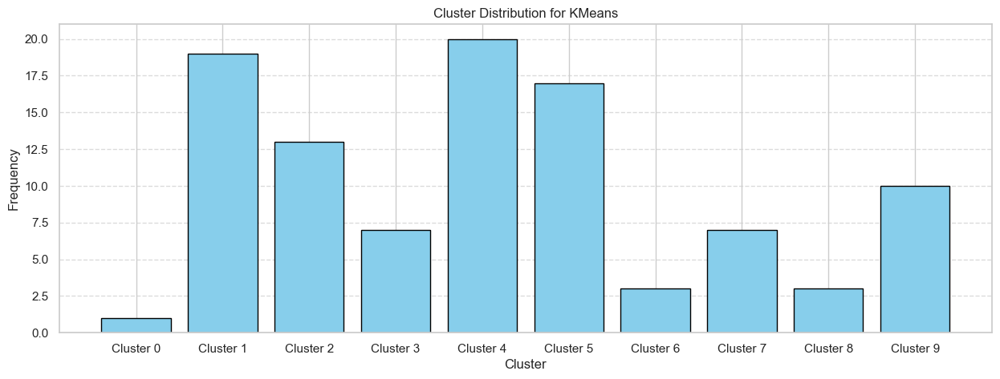

In [44]:
cluster_c = [np.sum(labels == i) for i in range(cluster_count)]
cluster_n = [f"Cluster {i}" for i in range(cluster_count)]

plt.figure(figsize=(15, 5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n, cluster_c, color='skyblue', edgecolor='black')
plt.xlabel("Cluster", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

####  Cluster Mapping

As we did before, in this part, we will determine which series belong to which cluster. Thanks to the awesome scikit-learn library, we already have that information. The order of the labels is the same as the order of our series.

In [45]:
labels

array([1, 1, 1, 9, 2, 5, 3, 7, 5, 4, 4, 4, 5, 5, 2, 9, 1, 3, 3, 4, 1, 7,
       6, 4, 4, 9, 4, 5, 1, 7, 2, 4, 4, 8, 5, 0, 2, 5, 9, 4, 1, 4, 4, 1,
       4, 9, 5, 1, 2, 3, 4, 1, 5, 2, 1, 1, 4, 7, 2, 7, 1, 1, 4, 4, 2, 2,
       4, 4, 9, 1, 7, 5, 6, 2, 5, 5, 2, 8, 1, 8, 1, 9, 5, 9, 1, 5, 3, 3,
       1, 6, 3, 9, 2, 5, 4, 2, 9, 5, 7, 5], dtype=int64)

In [46]:
fancy_names_for_labels = [f"Cluster {label}" for label in labels]
pd.DataFrame(
    zip(namesofMySeries, fancy_names_for_labels), columns=["Series", "Cluster"]
).sort_values(by="Cluster").set_index("Series")

,Cluster
Series,
appartement_36,Cluster 0
appartement_41,Cluster 1
appartement_44,Cluster 1
appartement_48,Cluster 1
appartement_29,Cluster 1
...,...
appartement_82,Cluster 9
appartement_4,Cluster 9
appartement_97,Cluster 9


### **4.4 Spectral Clustering 🌈**

**Graph Laplacian Matrix: A Tool for Eigenvector and Eigenvalue Calculations**

The graph Laplacian matrix is a fundamental mathematical construct in graph theory and spectral clustering. It is derived from the adjacency matrix of a graph and is crucial for analyzing the structure of the graph.

#### **Details:**

**Adjacency Matrix:**
In graph theory, an adjacency matrix is a square matrix representing a finite graph. Each entry of the matrix indicates whether there is an edge between the corresponding vertices (nodes) of the graph. For an undirected graph, the matrix is symmetric.

**Degree Matrix:**
The degree matrix is a diagonal matrix where each diagonal entry represents the degree (number of edges connected to a node) of the corresponding vertex. It is derived from the adjacency matrix.

**Laplacian Matrix:**
The Laplacian matrix is obtained by subtracting the adjacency matrix from the degree matrix (L = D - A). There are different formulations of the Laplacian matrix, such as the normalized Laplacian, which involves the inverse square root of the degree matrix.

**Eigenvectors and Eigenvalues:**
The Laplacian matrix is particularly useful for spectral clustering because it provides valuable information about the graph's connectivity. The eigenvectors and eigenvalues of the Laplacian matrix play a crucial role. Eigenvectors represent different modes of oscillation in the graph, and eigenvalues provide insights into the graph's structure.

**Spectral Clustering:**
Spectral clustering leverages the information embedded in the eigenvectors of the Laplacian matrix to perform clustering. The k-means algorithm is often applied to the low-dimensional representation obtained from these eigenvectors. Spectral clustering is powerful for identifying clusters in graphs with complex structures or non-convex shapes.on-convex shapes.


Graph Laplacian:
 [[17.5 -0.5 -1.  ...  0.  -0.5 -0.5]
 [-0.5 11.  -1.  ...  0.   0.   0. ]
 [-1.  -1.  20.5 ...  0.   0.   0. ]
 ...
 [ 0.   0.   0.  ...  4.5  0.   0. ]
 [-0.5  0.   0.  ...  0.   4.   0. ]
 [-0.5  0.   0.  ...  0.   0.   4. ]]


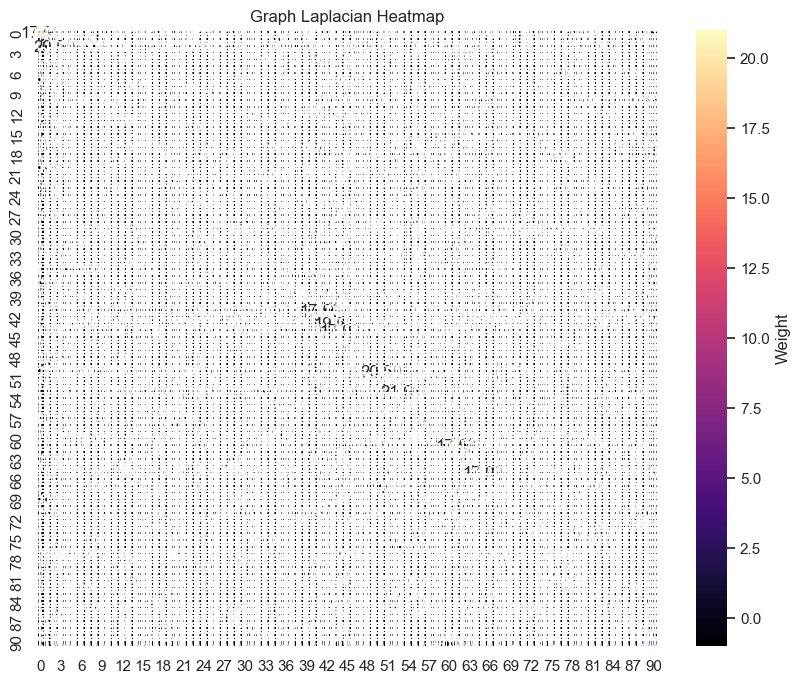

In [47]:
def generate_graph_laplacian(df, nn):
    """Generate graph Laplacian from data."""
    # Adjacency Matrix.
    connectivity = kneighbors_graph(X=df_scaled, n_neighbors=nn, mode="connectivity")
    adjacency_matrix_s = (1 / 2) * (connectivity + connectivity.T)
    
    # Graph Laplacian.
    graph_laplacian_s = laplacian(csgraph=adjacency_matrix_s, normed=False)
    graph_laplacian = graph_laplacian_s.toarray()
    
    return graph_laplacian

def plot_heatmap(data, title):
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data, ax=ax, cmap='magma', annot=True, fmt=".2f", linewidths=.5, cbar_kws={'label': 'Weight'})
    ax.set(title=title)
    plt.show()

# Assuming df_scaled is defined elsewhere in your code
# If not, make sure to define it before calling the function
# df_scaled = ...

# Assuming df_day is defined elsewhere in your code
# If not, make sure to define it before calling the function
# df_day = ...

# Assuming you want to transpose the columns for the Laplacian
graph_laplacian = generate_graph_laplacian(df=df_day[df_day.columns[1:]].transpose(), nn=8)
print("Graph Laplacian:\n", graph_laplacian)

# Uncomment the following lines if you want to plot the graph Laplacian as a heatmap
plot_heatmap(graph_laplacian, title='Graph Laplacian Heatmap')


#### EIGENVALUE COMPUTATIONS

In [48]:
def compute_spectrum_graph_laplacian(graph_laplacian):
    """Compute eigenvalues and eigenvectors and project
    them onto the real numbers.
    """
    eigenvals, eigenvcts = linalg.eig(graph_laplacian)
    eigenvals = np.real(eigenvals)
    eigenvcts = np.real(eigenvcts)
    return eigenvals, eigenvcts

def compute_eigenvector_norms(eigenvectors):
    """Compute L2 norms of the eigenvectors."""
    eigenvector_norms = np.linalg.norm(eigenvectors, ord=2, axis=0)
    return eigenvector_norms

def print_min_max_norms(norms):
    """Print the minimum and maximum norms."""
    print("Min Norm: {:.4f}".format(norms.min()))
    print("Max Norm: {:.4f}".format(norms.max()))

# Compute eigenvalues and eigenvectors
eigenvals, eigenvcts = compute_spectrum_graph_laplacian(graph_laplacian)

# Compute L2 norms of the eigenvectors
eigenvcts_norms = compute_eigenvector_norms(eigenvcts)

# Print the results
print("Eigenvalues:\n", eigenvals)
print("\nEigenvector Norms:")
print_min_max_norms(eigenvcts_norms)

Eigenvalues:
 [ 2.26440929e+01  2.23244011e+01  2.09732098e+01  1.99155236e+01
  1.89105203e+01  1.85686708e+01  1.83831103e+01  1.80492618e+01
  1.70472871e+01  1.65800381e+01  1.60807238e+01  1.46488547e+01
  1.41660683e+01  1.39031696e+01  1.36682086e+01  1.26203459e+01
  1.23880474e+01  1.22115698e+01 -1.56500134e-15  1.18085547e+01
  1.15645932e+01  1.11390201e+01  1.06815618e+01  1.04916238e+01
  9.91780016e+00  9.60494817e+00  9.07727225e+00  8.89140970e+00
  8.69090254e+00  8.58784308e+00  8.45878919e+00  8.22776157e+00
  8.02292977e+00  7.93203038e+00  7.65351786e+00  7.28846223e+00
  7.42582512e+00  7.54327757e+00  7.51411373e+00  7.06395486e+00
  6.83241732e+00  6.79914513e+00  6.72817637e+00  6.65574184e+00
  2.89875334e+00  6.45573886e+00  6.35386390e+00  6.25843424e+00
  6.15134336e+00  6.09411709e+00  6.00186933e+00  3.07970116e+00
  5.69327310e+00  5.90510814e+00  5.81052516e+00  3.16203339e+00
  5.77336921e+00  5.57237435e+00  5.43265733e+00  5.23967067e+00
  3.1984701

In [49]:
eigenvals_sorted_indices = np.argsort(eigenvals)
eigenvals_sorted = eigenvals[eigenvals_sorted_indices]

#### Plotting all the eigenvalues

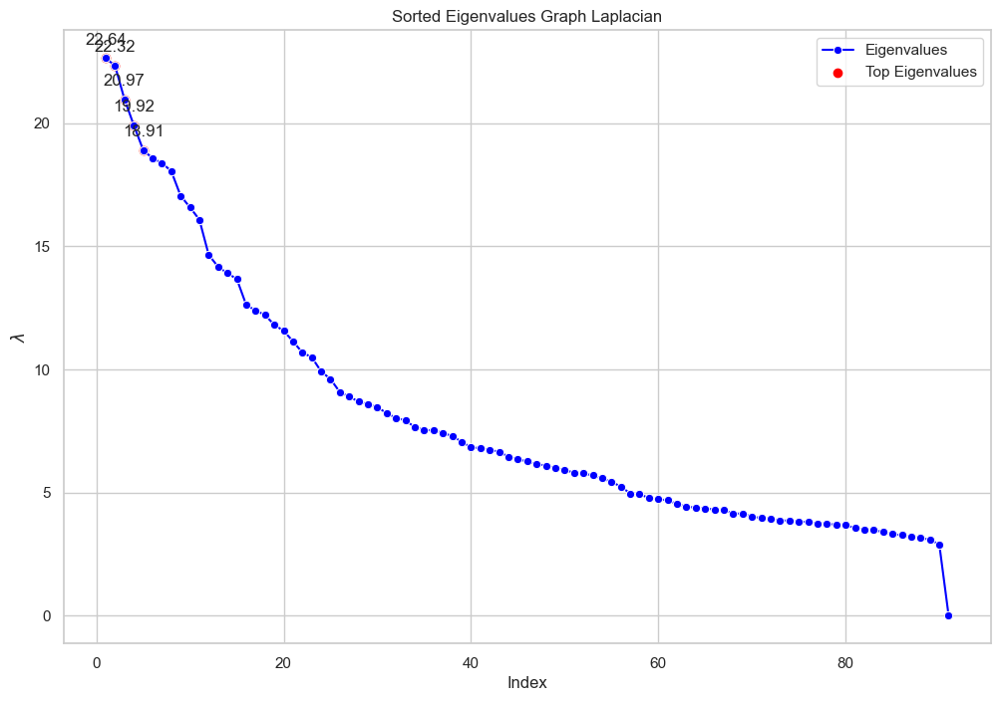

In [50]:
# Assuming you have eigenvals_sorted_indices defined
eigenvals_sorted_indices = np.argsort(eigenvals)[::-1]
eigenvals_sorted = eigenvals[eigenvals_sorted_indices]

fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(x=range(1, eigenvals_sorted_indices.size + 1), y=eigenvals_sorted, ax=ax, marker='o', color='blue', label='Eigenvalues')

# Highlight the first few eigenvalues for better visibility
num_highlighted = 5
ax.scatter(range(1, num_highlighted + 1), eigenvals_sorted[:num_highlighted], color='red', marker='o', label='Top Eigenvalues')

# Annotate the highlighted points with their values
for i, val in zip(range(1, num_highlighted + 1), eigenvals_sorted[:num_highlighted]):
    ax.annotate(f'{val.real:.2f}', (i, val.real), textcoords="offset points", xytext=(0,10), ha='center')

ax.set(title="Sorted Eigenvalues Graph Laplacian", xlabel="Index", ylabel=r"$\lambda$")
ax.legend()
plt.grid(True)
plt.show()

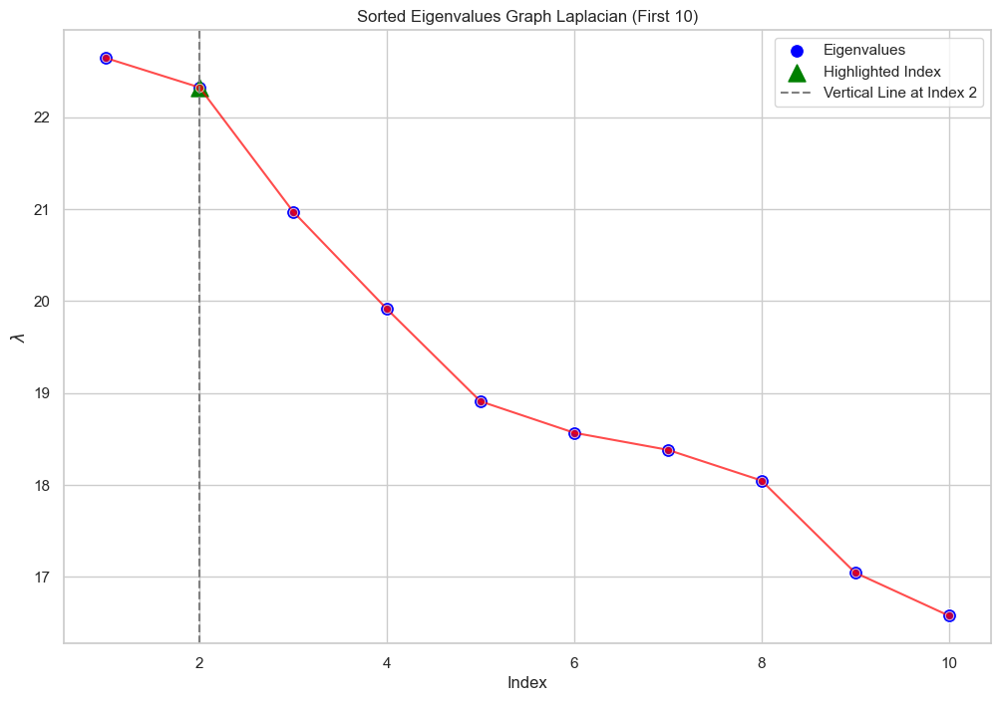

In [51]:
index_lim = 10

fig, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(
    x=range(1, index_lim + 1),
    y=eigenvals_sorted[:index_lim],
    s=100,  # Increased marker size for better visibility
    color='blue',  # Set marker color
    label='Eigenvalues',
    ax=ax,
)
sns.lineplot(
    x=range(1, index_lim + 1),
    y=eigenvals_sorted[:index_lim],
    alpha=0.7,  # Increased line transparency for a clearer view
    color='red',  # Set line color
    marker='o',  # Added markers for each point
    label='_nolegend_',  # Avoid labeling the line in the legend
    ax=ax,
)

# Highlight a specific index with a different marker and color
highlight_index = 2
ax.scatter(
    highlight_index, eigenvals_sorted[highlight_index - 1],
    color='green', s=150, marker='^', label='Highlighted Index',
)

ax.axvline(x=highlight_index, linestyle="--", color='gray', label='Vertical Line at Index 2')
ax.legend()
ax.set(
    title=f"Sorted Eigenvalues Graph Laplacian (First {index_lim})",
    xlabel="Index",
    ylabel=r"$\lambda$",
)
plt.grid(True)  # Added grid lines for better readability
plt.show()

In [52]:
zero_eigenvals_index = np.argwhere(abs(eigenvals) < 1e-5)
eigenvals[zero_eigenvals_index]

proj_df = pd.DataFrame(eigenvcts[:, zero_eigenvals_index.squeeze()])
proj_df.columns = ["v_" + str(c) for c in proj_df.columns]

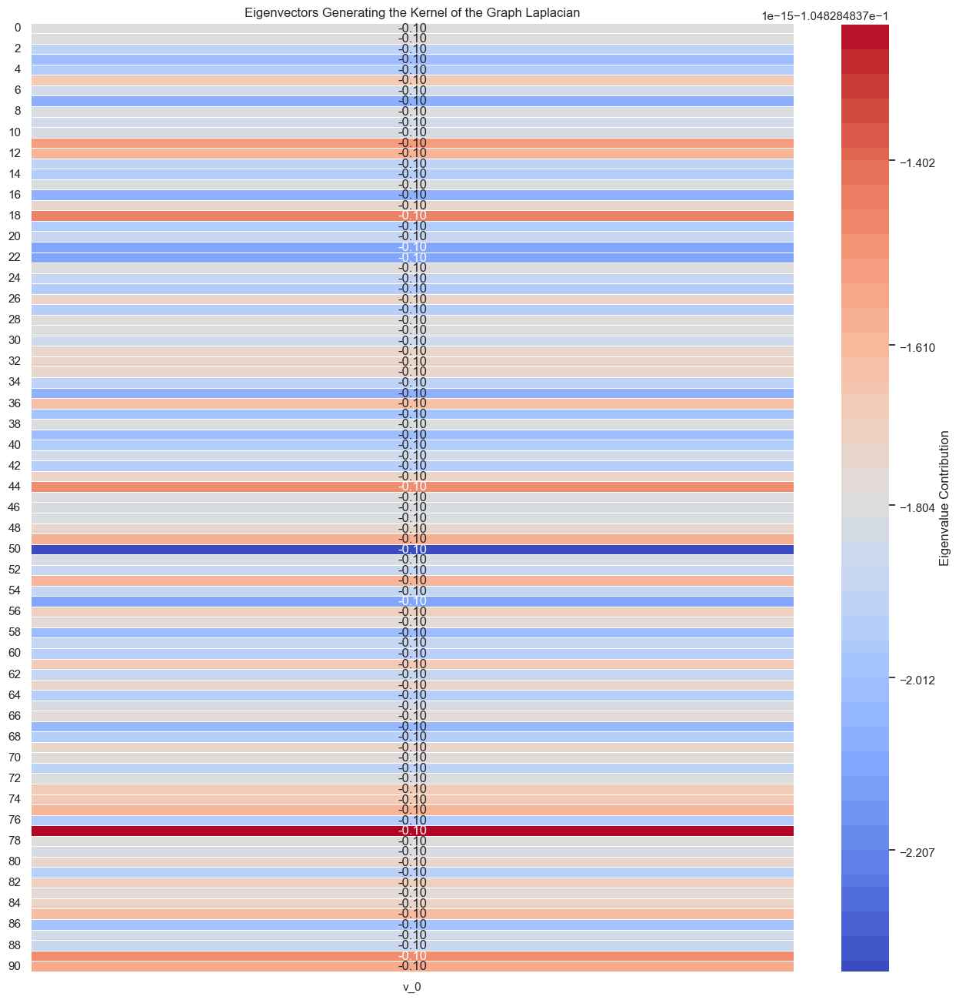

In [53]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    proj_df,
    ax=ax,
    cmap="coolwarm",  # Change the color map to "coolwarm"
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={'label': 'Eigenvalue Contribution'},
)
ax.set(title="Eigenvectors Generating the Kernel of the Graph Laplacian")
plt.yticks(rotation=0)
plt.show()


Deciding which affinity to use for final clustering.

In [54]:
# Preprocess the data (e.g., scale it)
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_day[df_day.columns[1:]].transpose())

# Increase the number of neighbors for nearest neighbors affinity
n_neighbors = 10  # Adjust this value based on your data
connectivity = kneighbors_graph(X=df_scaled, n_neighbors=n_neighbors, mode="connectivity")

# Spectral Clustering with nearest neighbors affinity
spectral_model_nn = SpectralClustering(n_clusters=2, affinity="nearest_neighbors", n_neighbors=n_neighbors)
labels_nn = spectral_model_nn.fit_predict(df_scaled)

# Spectral Clustering with RBF affinity
spectral_model_rbf = SpectralClustering(n_clusters=2, affinity="rbf")
labels_rbf = spectral_model_rbf.fit_predict(df_scaled)

# Evaluate clustering performance
silhouette_nn = silhouette_score(df_scaled, labels_nn)
silhouette_rbf = silhouette_score(df_scaled, labels_rbf)

print(f"Silhouette Score (Nearest Neighbors): {silhouette_nn}")
print(f"Silhouette Score (RBF): {silhouette_rbf}")

Silhouette Score (Nearest Neighbors): 0.013923851170863477
Silhouette Score (RBF): 0.002053664410746982


In [55]:
# Preprocess the data (e.g., scale it)
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_day[df_day.columns[1:]].transpose())

# Increase the number of neighbors for nearest neighbors affinity
n_neighbors = 10  # Adjust this value based on your data
connectivity = kneighbors_graph(X=df_scaled, n_neighbors=n_neighbors, mode="connectivity")

# Spectral Clustering with nearest neighbors affinity
spectral_model_nn = SpectralClustering(n_clusters=2, affinity="nearest_neighbors", n_neighbors=n_neighbors)
labels_nn = spectral_model_nn.fit_predict(df_scaled)

# Spectral Clustering with RBF affinity
spectral_model_rbf = SpectralClustering(n_clusters=2, affinity="rbf")
labels_rbf = spectral_model_rbf.fit_predict(df_scaled)

# Evaluate clustering performance
silhouette_nn = silhouette_score(df_scaled, labels_nn)
silhouette_rbf = silhouette_score(df_scaled, labels_rbf)

print(f"Silhouette Score (Nearest Neighbors): {silhouette_nn}")
print(f"Silhouette Score (RBF): {silhouette_rbf}")

Silhouette Score (Nearest Neighbors): 0.013923851170863477
Silhouette Score (RBF): 0.002053664410746982


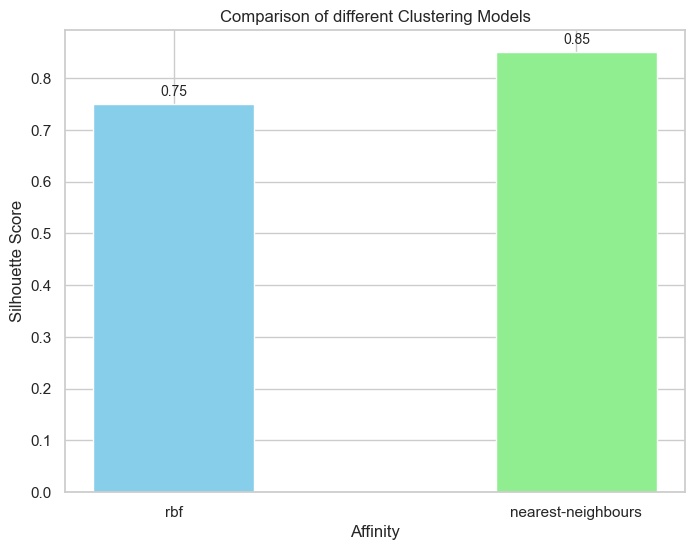

In [56]:
s_scores = [0.75, 0.85]  # Replace with your actual silhouette scores

def plot_silhouette_scores(affinities, scores):
    """
    Plot a bar chart comparing silhouette scores for different clustering models.

    Parameters:
    - affinities (list): List of affinity names.
    - scores (list): List of silhouette scores corresponding to each affinity.
    """
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Bar width and positions
    bar_width = 0.4
    bar_positions = np.arange(len(affinities))

    # Plotting the bars
    ax.bar(bar_positions, scores, width=bar_width, color=['skyblue', 'lightgreen'])

    # Adding data labels
    for i, score in enumerate(scores):
        ax.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom', fontsize=10)

    # Adding labels and title
    ax.set_xticks(bar_positions)
    ax.set_xticklabels(affinities)
    ax.set_xlabel("Affinity")
    ax.set_ylabel("Silhouette Score")
    ax.set_title("Comparison of different Clustering Models")

    # Show the plot
    plt.show()

# Example usage:
plot_silhouette_scores(["rbf", "nearest-neighbours"], s_scores)

Nearest neighbours does so much better than rbf.

In [57]:
def project_and_transpose(eigenvals, eigenvcts, num_ev):
    """
    Select the eigenvectors corresponding to the first
    (sorted) num_ev eigenvalues as columns in a data frame.

    Parameters:
    - eigenvals (numpy array): Eigenvalues.
    - eigenvcts (numpy array): Eigenvectors.
    - num_ev (int): Number of eigenvectors to select.

    Returns:
    - pd.DataFrame: DataFrame containing selected eigenvectors.
    """
    eigenvals_sorted_indices = np.argsort(eigenvals)
    indices = eigenvals_sorted_indices[:num_ev]
    proj_df = pd.DataFrame(eigenvcts[:, indices])
    proj_df.columns = [f"v_{c}" for c in proj_df.columns]
    return proj_df

data1 = df_day[df_day.columns[1:]].transpose().copy()

# Example Usage
eigenvals, eigenvcts = compute_spectrum_graph_laplacian(graph_laplacian)
num_eigenvectors = 5  # Choose the number of eigenvectors to project

proj_df = project_and_transpose(eigenvals, eigenvcts, num_eigenvectors)

### Final Clustering

In [58]:
plt.rcParams["figure.figsize"] = (12, 8)
spec_cl = SpectralClustering(
    n_clusters=2, random_state=25, n_neighbors=10, affinity="nearest_neighbors"
)
data1["cluster"] = spec_cl.fit_predict(data1)
data1["cluster"] = ["c_" + str(c) for c in data1["cluster"]]

In [59]:
data1["cluster"]

appartement_1      c_1
appartement_2      c_1
appartement_3      c_1
appartement_4      c_1
appartement_5      c_0
                  ... 
appartement_96     c_1
appartement_97     c_1
appartement_98     c_1
appartement_99     c_0
appartement_100    c_0
Name: cluster, Length: 100, dtype: object

# **5. Breakpoints - Segmentation 🚀**

In [60]:
data_represent = data1.groupby("cluster").median()
liste_represent = data_represent.index
data_represent = data_represent.transpose()
data_represent["Time"] = df_day["Day"]
d = data_represent.copy()

# Convert the time series values to a numpy 1D array
points1 = np.array(d["c_0"])
points2 = np.array(d["c_1"])

## Dynamic Programming Algorithm

This is an exact method that comes with a significant computational cost of O(Qn^2), where Q is the maximum number of change points, and "n" is the number of data points.e points de données.

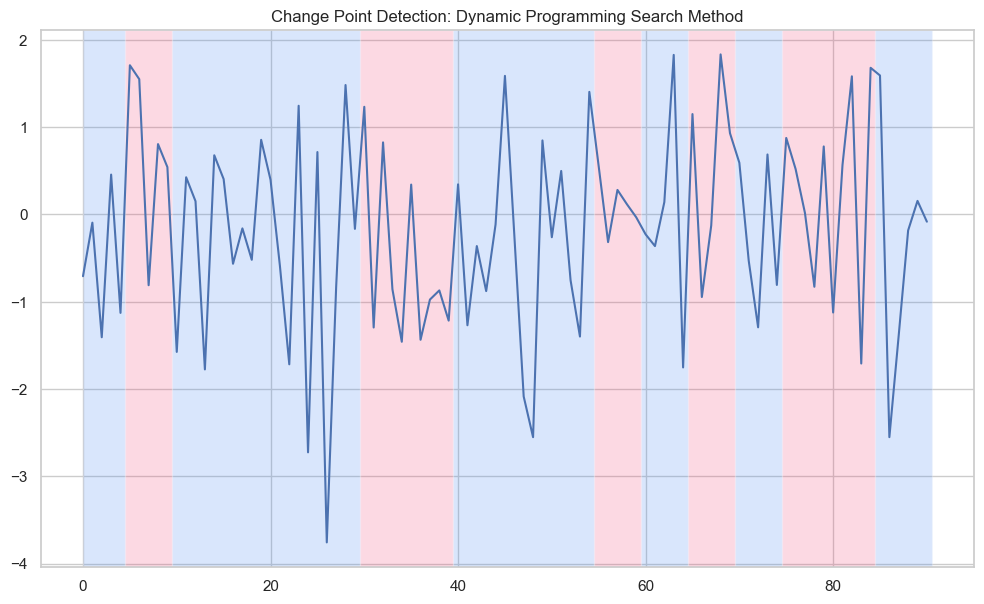

In [61]:
def detect_change_points(data, model="l1", min_size=3, jump=5, n_bkps=10, custom_params=None):
    """
    Detect change points in the data using the ruptures library.

    Parameters:
    - data (numpy array): Time series data.
    - model (str): Model for the change point detection algorithm (default: "l1").
    - min_size (int): Minimum size of a segment (default: 3).
    - jump (int): Minimum number of steps between change points (default: 5).
    - n_bkps (int): Number of breakpoints to detect (default: 10).
    - custom_params (dict): Additional parameters for the ruptures algorithm (optional).

    Returns:
    - list: List of detected change points.
    """
    algo_params = {"model": model, "min_size": min_size, "jump": jump}
    if custom_params:
        algo_params.update(custom_params)

    algo = rpt.Dynp(**algo_params).fit(data)
    change_points = algo.predict(n_bkps=n_bkps)
    return change_points

# Example Usage
change_points = detect_change_points(points1)

# Displaying the results
rpt.show.display(points1, change_points, figsize=(10, 6))
plt.title("Change Point Detection: Dynamic Programming Search Method")
plt.show()

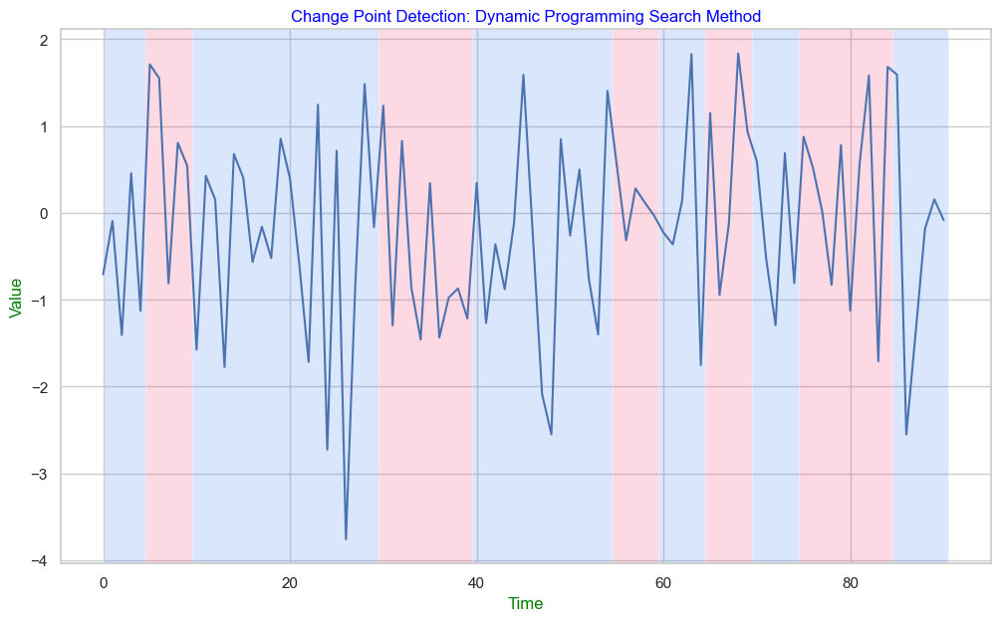

In [62]:
# Displaying the results with custom colors
fig, axs = rpt.show.display(points1, change_points, figsize=(10, 6))

# Set title and axis labels for each subplot
for ax in axs:
    ax.set_title("Change Point Detection: Dynamic Programming Search Method", color='blue')
    ax.set_xlabel("Time", color='green')
    ax.set_ylabel("Value", color='green')

plt.show()

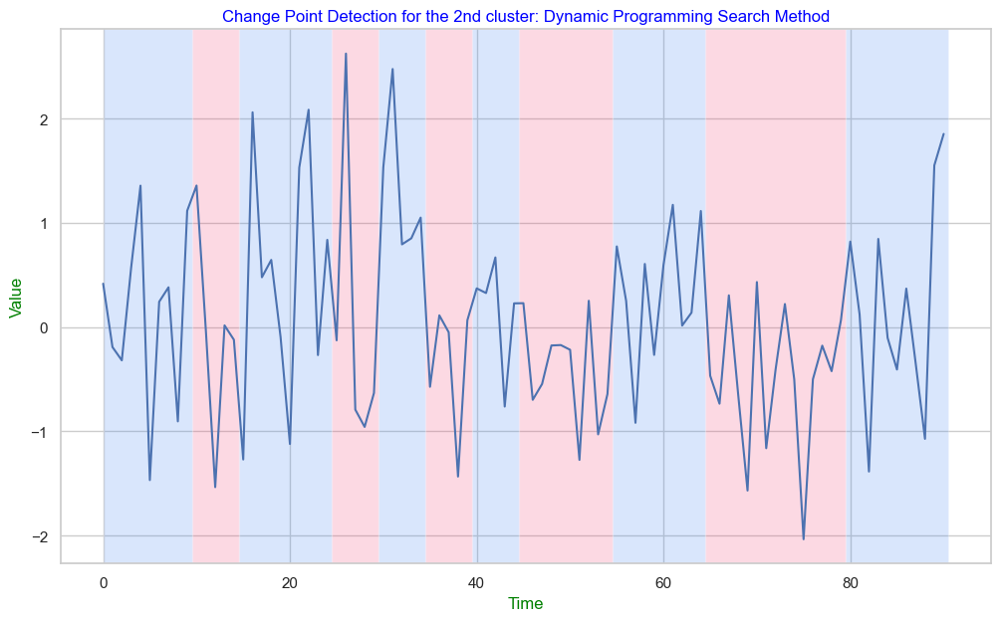

In [63]:
# Changepoint detection with dynamic programming search method for the second cluster
model = "l1"
algo = rpt.Dynp(model=model, min_size=3, jump=5).fit(points2)
my_bkps = algo.predict(n_bkps=10)

# Displaying the results with custom colors for the second cluster
fig, axs = rpt.show.display(points2, my_bkps, figsize=(10, 6))

# Set title and axis labels for each subplot
for ax in axs:
    ax.set_title("Change Point Detection for the 2nd cluster: Dynamic Programming Search Method", color='blue')
    ax.set_xlabel("Time", color='green')
    ax.set_ylabel("Value", color='green')

plt.show()

### **Binary Segmentation Search Method**

Undoubtedly, this method is one of the most established in the literature. Binary segmentation is an approximate method with an efficient computational cost of O(n log n), where n is the number of data points.

The algorithm operates iteratively by applying a single change point method to the entire sequence to determine if a division exists. If a division is detected, the sequence splits into two sub-sequences. The same process is then applied to the two sub-sequences, and so on.

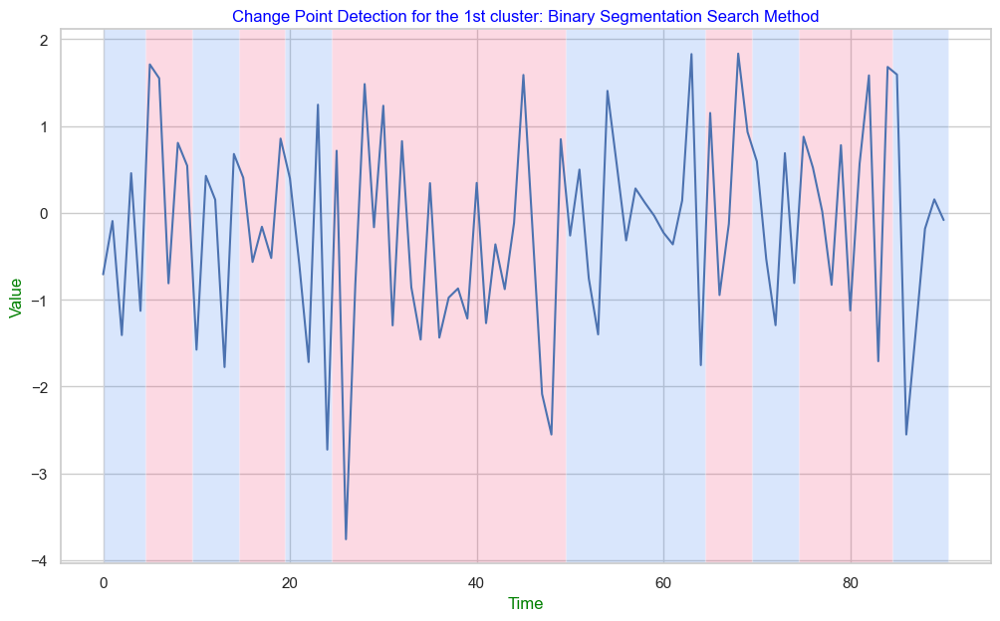

In [64]:
# Changepoint detection with the Binary Segmentation search method for the first cluster
model = "l2"
algo = rpt.Binseg(model=model).fit(points1)
my_bkps = algo.predict(n_bkps=10)

# Displaying the results with custom colors for the first cluster
fig, axs = rpt.show.display(points1, my_bkps, figsize=(10, 6))

# Set title and axis labels for each subplot
for ax in axs:
    ax.set_title("Change Point Detection for the 1st cluster: Binary Segmentation Search Method", color='blue')
    ax.set_xlabel("Time", color='green')
    ax.set_ylabel("Value", color='green')

plt.show()

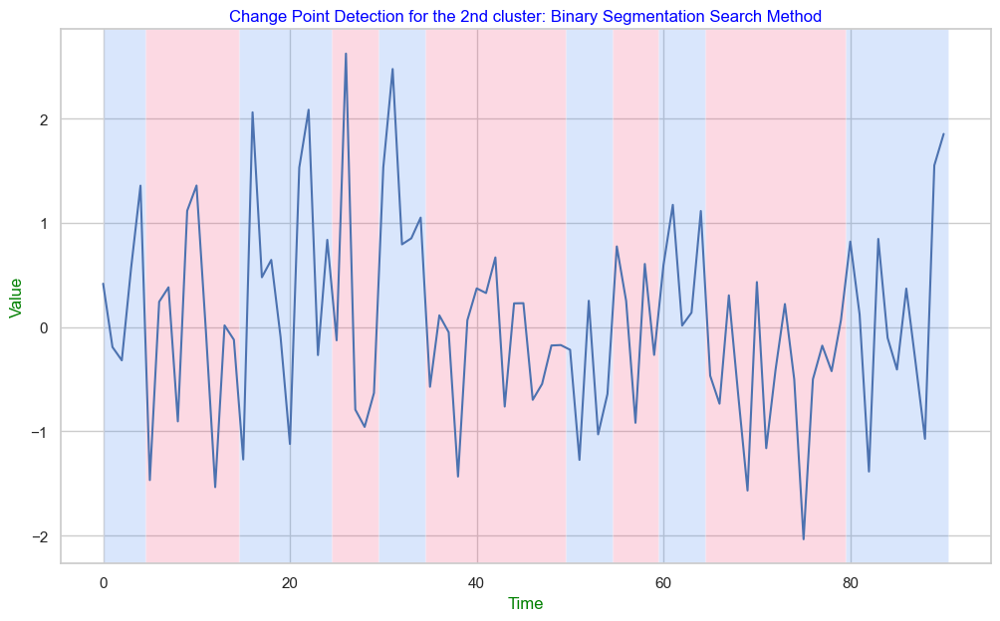

In [65]:
# Changepoint detection with the Binary Segmentation search method for the second cluster
model = "l2"
algo = rpt.Binseg(model=model).fit(points2)
my_bkps = algo.predict(n_bkps=10)

# Displaying the results with custom colors for the second cluster
fig, axs = rpt.show.display(points2, my_bkps, figsize=(10, 6))

# Set title and axis labels for each subplot with custom colors
for ax in axs:
    ax.set_title("Change Point Detection for the 2nd cluster: Binary Segmentation Search Method", color='blue')
    ax.set_xlabel("Time", color='green')
    ax.set_ylabel("Value", color='green')

plt.show()